# E9 246 Advanced Image Processing - Assignment 1
***
*Submitted by: Dwaipayan Haldar*<br>
*S.R. No. : 27128*

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color
from skimage.transform import rotate
import os
from tqdm.auto import tqdm
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import seaborn as sns
from sklearn.neighbors import KNeighborsClassifier

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, models
from typing import Callable, Literal
from torch import Tensor


device = torch.device("cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu")

from src.P01_lbp import *

## Problem 1: Local Binary Pattern (LBP) for Texture Analysis

### Problem 1.(a)

In [25]:
#Run a loop over all the train dataset images and extract LBP histograms
train_histograms = []
train_labels = []
train_path = "DTD_dataset/train/"

class_dirs = sorted([d for d in os.listdir(train_path) if os.path.isdir(os.path.join(train_path, d))])

for label, class_name in enumerate(tqdm(class_dirs, desc="Processing classes")):
    class_path = os.path.join(train_path, class_name)
    image_files = [f for f in os.listdir(class_path) if f.endswith('.png')]
    
    for image_file in tqdm(image_files, desc=f"  {class_name}", leave=False):
        image_path = os.path.join(class_path, image_file)
        image = io.imread(image_path)
        image = color.rgb2gray(image)
        histogram = local_binary_pattern_vectorised(image)
        train_histograms.append(histogram)
        train_labels.append(label)

train_labels = np.array(train_labels)
train_histograms = np.array(train_histograms)

Processing classes:   0%|          | 0/47 [00:00<?, ?it/s]

  banded:   0%|          | 0/40 [00:00<?, ?it/s]

  blotchy:   0%|          | 0/40 [00:00<?, ?it/s]

  braided:   0%|          | 0/40 [00:00<?, ?it/s]

  bubbly:   0%|          | 0/40 [00:00<?, ?it/s]

  bumpy:   0%|          | 0/40 [00:00<?, ?it/s]

  chequered:   0%|          | 0/40 [00:00<?, ?it/s]

  cobwebbed:   0%|          | 0/40 [00:00<?, ?it/s]

  cracked:   0%|          | 0/40 [00:00<?, ?it/s]

  crosshatched:   0%|          | 0/40 [00:00<?, ?it/s]

  crystalline:   0%|          | 0/40 [00:00<?, ?it/s]

  dotted:   0%|          | 0/40 [00:00<?, ?it/s]

  fibrous:   0%|          | 0/40 [00:00<?, ?it/s]

  flecked:   0%|          | 0/40 [00:00<?, ?it/s]

  freckled:   0%|          | 0/40 [00:00<?, ?it/s]

  frilly:   0%|          | 0/40 [00:00<?, ?it/s]

  gauzy:   0%|          | 0/40 [00:00<?, ?it/s]

  grid:   0%|          | 0/40 [00:00<?, ?it/s]

  grooved:   0%|          | 0/40 [00:00<?, ?it/s]

  honeycombed:   0%|          | 0/40 [00:00<?, ?it/s]

  interlaced:   0%|          | 0/40 [00:00<?, ?it/s]

  knitted:   0%|          | 0/40 [00:00<?, ?it/s]

  lacelike:   0%|          | 0/40 [00:00<?, ?it/s]

  lined:   0%|          | 0/40 [00:00<?, ?it/s]

  marbled:   0%|          | 0/40 [00:00<?, ?it/s]

  matted:   0%|          | 0/40 [00:00<?, ?it/s]

  meshed:   0%|          | 0/40 [00:00<?, ?it/s]

  paisley:   0%|          | 0/40 [00:00<?, ?it/s]

  perforated:   0%|          | 0/40 [00:00<?, ?it/s]

  pitted:   0%|          | 0/40 [00:00<?, ?it/s]

  pleated:   0%|          | 0/40 [00:00<?, ?it/s]

  polka-dotted:   0%|          | 0/40 [00:00<?, ?it/s]

  porous:   0%|          | 0/40 [00:00<?, ?it/s]

  potholed:   0%|          | 0/40 [00:00<?, ?it/s]

  scaly:   0%|          | 0/40 [00:00<?, ?it/s]

  smeared:   0%|          | 0/40 [00:00<?, ?it/s]

  spiralled:   0%|          | 0/40 [00:00<?, ?it/s]

  sprinkled:   0%|          | 0/40 [00:00<?, ?it/s]

  stained:   0%|          | 0/40 [00:00<?, ?it/s]

  stratified:   0%|          | 0/40 [00:00<?, ?it/s]

  striped:   0%|          | 0/40 [00:00<?, ?it/s]

  studded:   0%|          | 0/40 [00:00<?, ?it/s]

  swirly:   0%|          | 0/40 [00:00<?, ?it/s]

  veined:   0%|          | 0/40 [00:00<?, ?it/s]

  waffled:   0%|          | 0/40 [00:00<?, ?it/s]

  woven:   0%|          | 0/40 [00:00<?, ?it/s]

  wrinkled:   0%|          | 0/40 [00:00<?, ?it/s]

  zigzagged:   0%|          | 0/40 [00:00<?, ?it/s]

In [26]:
#Run a loop over all the test dataset images and extract LBP histograms
test_histograms = []
test_labels = []
test_images = []
test_path = "DTD_dataset/test/"

class_dirs_test = sorted([d for d in os.listdir(test_path) if os.path.isdir(os.path.join(test_path, d))])

for label, class_name in enumerate(tqdm(class_dirs_test, desc="Processing classes")):
    class_path = os.path.join(test_path, class_name)
    image_files = [f for f in os.listdir(class_path) if f.endswith('.png')]
    
    for image_file in tqdm(image_files, desc=f"  {class_name}", leave=False):
        image_path = os.path.join(class_path, image_file)
        image = io.imread(image_path)
        image = color.rgb2gray(image)
        test_images.append(image)
        histogram = local_binary_pattern_vectorised(image)
        test_histograms.append(histogram)
        test_labels.append(label)

test_labels = np.array(test_labels)
test_histograms = np.array(test_histograms)

Processing classes:   0%|          | 0/47 [00:00<?, ?it/s]

  banded:   0%|          | 0/40 [00:00<?, ?it/s]

  blotchy:   0%|          | 0/40 [00:00<?, ?it/s]

  braided:   0%|          | 0/40 [00:00<?, ?it/s]

  bubbly:   0%|          | 0/40 [00:00<?, ?it/s]

  bumpy:   0%|          | 0/40 [00:00<?, ?it/s]

  chequered:   0%|          | 0/40 [00:00<?, ?it/s]

  cobwebbed:   0%|          | 0/40 [00:00<?, ?it/s]

  cracked:   0%|          | 0/40 [00:00<?, ?it/s]

  crosshatched:   0%|          | 0/40 [00:00<?, ?it/s]

  crystalline:   0%|          | 0/40 [00:00<?, ?it/s]

  dotted:   0%|          | 0/40 [00:00<?, ?it/s]

  fibrous:   0%|          | 0/40 [00:00<?, ?it/s]

  flecked:   0%|          | 0/40 [00:00<?, ?it/s]

  freckled:   0%|          | 0/40 [00:00<?, ?it/s]

  frilly:   0%|          | 0/40 [00:00<?, ?it/s]

  gauzy:   0%|          | 0/40 [00:00<?, ?it/s]

  grid:   0%|          | 0/40 [00:00<?, ?it/s]

  grooved:   0%|          | 0/40 [00:00<?, ?it/s]

  honeycombed:   0%|          | 0/40 [00:00<?, ?it/s]

  interlaced:   0%|          | 0/40 [00:00<?, ?it/s]

  knitted:   0%|          | 0/40 [00:00<?, ?it/s]

  lacelike:   0%|          | 0/40 [00:00<?, ?it/s]

  lined:   0%|          | 0/40 [00:00<?, ?it/s]

  marbled:   0%|          | 0/40 [00:00<?, ?it/s]

  matted:   0%|          | 0/40 [00:00<?, ?it/s]

  meshed:   0%|          | 0/40 [00:00<?, ?it/s]

  paisley:   0%|          | 0/40 [00:00<?, ?it/s]

  perforated:   0%|          | 0/40 [00:00<?, ?it/s]

  pitted:   0%|          | 0/40 [00:00<?, ?it/s]

  pleated:   0%|          | 0/40 [00:00<?, ?it/s]

  polka-dotted:   0%|          | 0/40 [00:00<?, ?it/s]

  porous:   0%|          | 0/40 [00:00<?, ?it/s]

  potholed:   0%|          | 0/40 [00:00<?, ?it/s]

  scaly:   0%|          | 0/40 [00:00<?, ?it/s]

  smeared:   0%|          | 0/40 [00:00<?, ?it/s]

  spiralled:   0%|          | 0/40 [00:00<?, ?it/s]

  sprinkled:   0%|          | 0/40 [00:00<?, ?it/s]

  stained:   0%|          | 0/40 [00:00<?, ?it/s]

  stratified:   0%|          | 0/40 [00:00<?, ?it/s]

  striped:   0%|          | 0/40 [00:00<?, ?it/s]

  studded:   0%|          | 0/40 [00:00<?, ?it/s]

  swirly:   0%|          | 0/40 [00:00<?, ?it/s]

  veined:   0%|          | 0/40 [00:00<?, ?it/s]

  waffled:   0%|          | 0/40 [00:00<?, ?it/s]

  woven:   0%|          | 0/40 [00:00<?, ?it/s]

  wrinkled:   0%|          | 0/40 [00:00<?, ?it/s]

  zigzagged:   0%|          | 0/40 [00:00<?, ?it/s]

In [27]:
# 1-NN Classification
predicted_labels = []

for test_hist in tqdm(test_histograms, desc="Classifying"):
    distances = np.linalg.norm(train_histograms - test_hist, axis=1)
    nearest_idx = np.argmin(distances)
    predicted_labels.append(train_labels[nearest_idx])

predicted_labels = np.array(predicted_labels)

Classifying:   0%|          | 0/1880 [00:00<?, ?it/s]

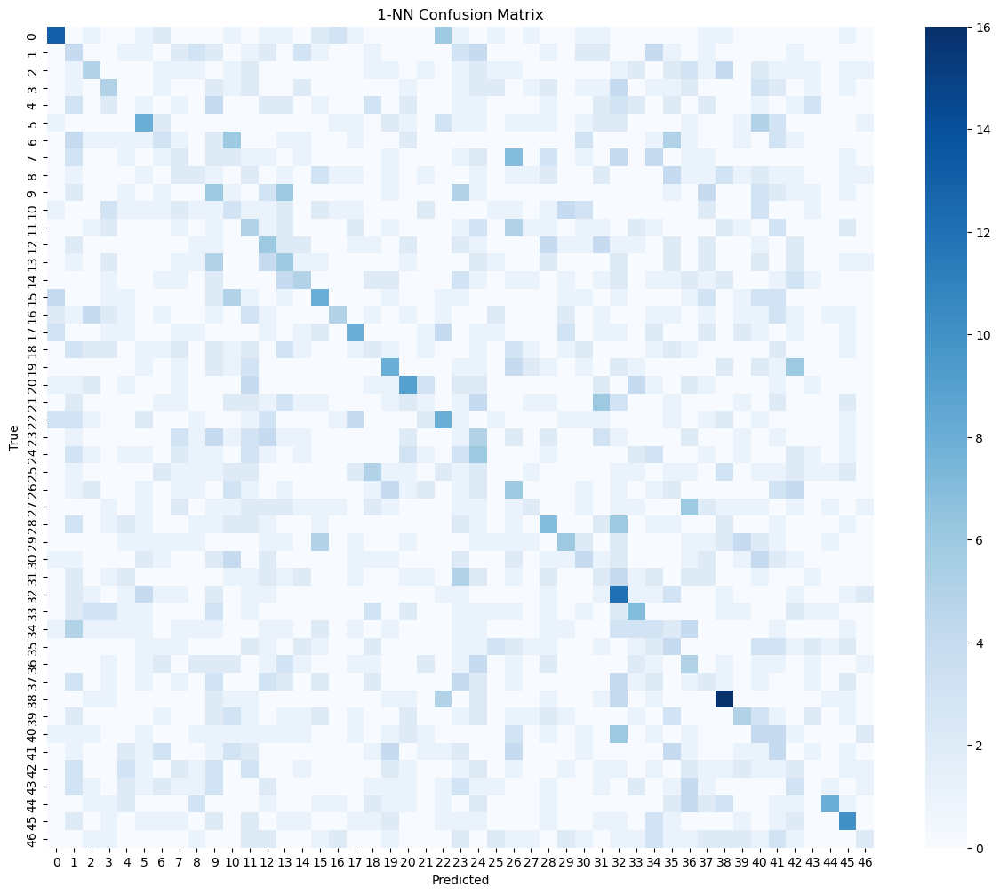

              precision    recall  f1-score   support

           0       0.42      0.33      0.37        40
           1       0.06      0.10      0.07        40
           2       0.17      0.12      0.14        40
           3       0.14      0.12      0.13        40
           4       0.00      0.00      0.00        40
           5       0.21      0.20      0.20        40
           6       0.10      0.07      0.08        40
           7       0.05      0.05      0.05        40
           8       0.07      0.05      0.06        40
           9       0.08      0.15      0.11        40
          10       0.06      0.07      0.07        40
          11       0.08      0.12      0.10        40
          12       0.11      0.15      0.13        40
          13       0.12      0.15      0.13        40
          14       0.17      0.12      0.14        40
          15       0.22      0.20      0.21        40
          16       0.31      0.12      0.18        40
          17       0.26    

In [28]:
# Confusion matrix
cm = confusion_matrix(test_labels, predicted_labels)

plt.figure(figsize=(15, 12))
sns.heatmap(cm, annot=False, cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('1-NN Confusion Matrix')
plt.show()

# Detailed report
print(classification_report(test_labels, predicted_labels))

### Problem 1.(b)

In [29]:
rotation_accuracy = {}
angle_values = [0,15,30,45,60,90,105,120,135,150,165,180]

for angle in angle_values:
    rotated_predicted_labels = []
    for image in tqdm(test_images, desc=f"Classifying rotated by {angle} degrees"):
        rotated_image = rotate(image, angle)
        histogram = local_binary_pattern_vectorised(rotated_image)
        
        distances = np.linalg.norm(train_histograms - histogram, axis=1)
        nearest_idx = np.argmin(distances)
        rotated_predicted_labels.append(train_labels[nearest_idx])
    
    rotated_predicted_labels = np.array(rotated_predicted_labels)
    accuracy = accuracy_score(test_labels, rotated_predicted_labels)
    rotation_accuracy[angle] = accuracy
    print(f"Accuracy for {angle} degree rotation: {accuracy:.4f}")


Classifying rotated by 0 degrees:   0%|          | 0/1880 [00:00<?, ?it/s]

Accuracy for 0 degree rotation: 0.1277


Classifying rotated by 15 degrees:   0%|          | 0/1880 [00:00<?, ?it/s]

Accuracy for 15 degree rotation: 0.0553


Classifying rotated by 30 degrees:   0%|          | 0/1880 [00:00<?, ?it/s]

Accuracy for 30 degree rotation: 0.0367


Classifying rotated by 45 degrees:   0%|          | 0/1880 [00:00<?, ?it/s]

Accuracy for 45 degree rotation: 0.0229


Classifying rotated by 60 degrees:   0%|          | 0/1880 [00:00<?, ?it/s]

Accuracy for 60 degree rotation: 0.0293


Classifying rotated by 90 degrees:   0%|          | 0/1880 [00:00<?, ?it/s]

Accuracy for 90 degree rotation: 0.0441


Classifying rotated by 105 degrees:   0%|          | 0/1880 [00:00<?, ?it/s]

Accuracy for 105 degree rotation: 0.0324


Classifying rotated by 120 degrees:   0%|          | 0/1880 [00:00<?, ?it/s]

Accuracy for 120 degree rotation: 0.0282


Classifying rotated by 135 degrees:   0%|          | 0/1880 [00:00<?, ?it/s]

Accuracy for 135 degree rotation: 0.0218


Classifying rotated by 150 degrees:   0%|          | 0/1880 [00:00<?, ?it/s]

Accuracy for 150 degree rotation: 0.0298


Classifying rotated by 165 degrees:   0%|          | 0/1880 [00:00<?, ?it/s]

Accuracy for 165 degree rotation: 0.0468


Classifying rotated by 180 degrees:   0%|          | 0/1880 [00:00<?, ?it/s]

Accuracy for 180 degree rotation: 0.1250


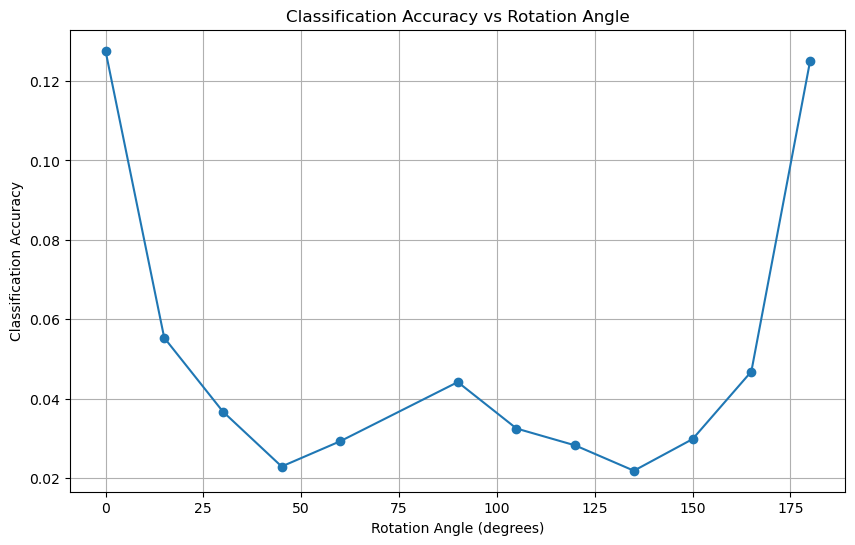

In [30]:
plt.figure(figsize=(10, 6))
plt.plot(list(rotation_accuracy.keys()), list(rotation_accuracy.values()), marker='o')
plt.title('Classification Accuracy vs Rotation Angle')
plt.xlabel('Rotation Angle (degrees)')
plt.ylabel('Classification Accuracy')
plt.grid()
plt.show()

### Problem 1 (c)

In [31]:
#Run a loop over all the train dataset images and extract LBP Roation Invariant histograms
train_histograms_riu = []
train_labels_riu = []
train_path = "DTD_dataset/train/"

class_dirs = sorted([d for d in os.listdir(train_path) if os.path.isdir(os.path.join(train_path, d))])

for label, class_name in enumerate(tqdm(class_dirs, desc="Processing classes")):
    class_path = os.path.join(train_path, class_name)
    image_files = [f for f in os.listdir(class_path) if f.endswith('.png')]
    
    for image_file in tqdm(image_files, desc=f"  {class_name}", leave=False):
        image_path = os.path.join(class_path, image_file)
        image = io.imread(image_path)
        image = color.rgb2gray(image)
        histogram = local_binary_pattern_riu(image)
        train_histograms_riu.append(histogram)
        train_labels_riu.append(label)

train_labels_riu = np.array(train_labels_riu)
train_histograms_riu = np.array(train_histograms_riu)

Processing classes:   0%|          | 0/47 [00:00<?, ?it/s]

  banded:   0%|          | 0/40 [00:00<?, ?it/s]

  blotchy:   0%|          | 0/40 [00:00<?, ?it/s]

  braided:   0%|          | 0/40 [00:00<?, ?it/s]

  bubbly:   0%|          | 0/40 [00:00<?, ?it/s]

  bumpy:   0%|          | 0/40 [00:00<?, ?it/s]

  chequered:   0%|          | 0/40 [00:00<?, ?it/s]

  cobwebbed:   0%|          | 0/40 [00:00<?, ?it/s]

  cracked:   0%|          | 0/40 [00:00<?, ?it/s]

  crosshatched:   0%|          | 0/40 [00:00<?, ?it/s]

  crystalline:   0%|          | 0/40 [00:00<?, ?it/s]

  dotted:   0%|          | 0/40 [00:00<?, ?it/s]

  fibrous:   0%|          | 0/40 [00:00<?, ?it/s]

  flecked:   0%|          | 0/40 [00:00<?, ?it/s]

  freckled:   0%|          | 0/40 [00:00<?, ?it/s]

  frilly:   0%|          | 0/40 [00:00<?, ?it/s]

  gauzy:   0%|          | 0/40 [00:00<?, ?it/s]

  grid:   0%|          | 0/40 [00:00<?, ?it/s]

  grooved:   0%|          | 0/40 [00:00<?, ?it/s]

  honeycombed:   0%|          | 0/40 [00:00<?, ?it/s]

  interlaced:   0%|          | 0/40 [00:00<?, ?it/s]

  knitted:   0%|          | 0/40 [00:00<?, ?it/s]

  lacelike:   0%|          | 0/40 [00:00<?, ?it/s]

  lined:   0%|          | 0/40 [00:00<?, ?it/s]

  marbled:   0%|          | 0/40 [00:00<?, ?it/s]

  matted:   0%|          | 0/40 [00:00<?, ?it/s]

  meshed:   0%|          | 0/40 [00:00<?, ?it/s]

  paisley:   0%|          | 0/40 [00:00<?, ?it/s]

  perforated:   0%|          | 0/40 [00:00<?, ?it/s]

  pitted:   0%|          | 0/40 [00:00<?, ?it/s]

  pleated:   0%|          | 0/40 [00:00<?, ?it/s]

  polka-dotted:   0%|          | 0/40 [00:00<?, ?it/s]

  porous:   0%|          | 0/40 [00:00<?, ?it/s]

  potholed:   0%|          | 0/40 [00:00<?, ?it/s]

  scaly:   0%|          | 0/40 [00:00<?, ?it/s]

  smeared:   0%|          | 0/40 [00:00<?, ?it/s]

  spiralled:   0%|          | 0/40 [00:00<?, ?it/s]

  sprinkled:   0%|          | 0/40 [00:00<?, ?it/s]

  stained:   0%|          | 0/40 [00:00<?, ?it/s]

  stratified:   0%|          | 0/40 [00:00<?, ?it/s]

  striped:   0%|          | 0/40 [00:00<?, ?it/s]

  studded:   0%|          | 0/40 [00:00<?, ?it/s]

  swirly:   0%|          | 0/40 [00:00<?, ?it/s]

  veined:   0%|          | 0/40 [00:00<?, ?it/s]

  waffled:   0%|          | 0/40 [00:00<?, ?it/s]

  woven:   0%|          | 0/40 [00:00<?, ?it/s]

  wrinkled:   0%|          | 0/40 [00:00<?, ?it/s]

  zigzagged:   0%|          | 0/40 [00:00<?, ?it/s]

In [32]:
#Run a loop over all the test dataset images and extract LBP rotation invariant histograms
test_histograms_riu = []
test_labels_riu = []
test_images = []
test_path = "DTD_dataset/test/"

class_dirs_test = sorted([d for d in os.listdir(test_path) if os.path.isdir(os.path.join(test_path, d))])

for label, class_name in enumerate(tqdm(class_dirs_test, desc="Processing classes")):
    class_path = os.path.join(test_path, class_name)
    image_files = [f for f in os.listdir(class_path) if f.endswith('.png')]
    
    for image_file in tqdm(image_files, desc=f"  {class_name}", leave=False):
        image_path = os.path.join(class_path, image_file)
        image = io.imread(image_path)
        image = color.rgb2gray(image)
        test_images.append(image)
        histogram = local_binary_pattern_riu(image)
        test_histograms_riu.append(histogram)
        test_labels_riu.append(label)

test_labels_riu = np.array(test_labels_riu)
test_histograms_riu = np.array(test_histograms_riu)

Processing classes:   0%|          | 0/47 [00:00<?, ?it/s]

  banded:   0%|          | 0/40 [00:00<?, ?it/s]

  blotchy:   0%|          | 0/40 [00:00<?, ?it/s]

  braided:   0%|          | 0/40 [00:00<?, ?it/s]

  bubbly:   0%|          | 0/40 [00:00<?, ?it/s]

  bumpy:   0%|          | 0/40 [00:00<?, ?it/s]

  chequered:   0%|          | 0/40 [00:00<?, ?it/s]

  cobwebbed:   0%|          | 0/40 [00:00<?, ?it/s]

  cracked:   0%|          | 0/40 [00:00<?, ?it/s]

  crosshatched:   0%|          | 0/40 [00:00<?, ?it/s]

  crystalline:   0%|          | 0/40 [00:00<?, ?it/s]

  dotted:   0%|          | 0/40 [00:00<?, ?it/s]

  fibrous:   0%|          | 0/40 [00:00<?, ?it/s]

  flecked:   0%|          | 0/40 [00:00<?, ?it/s]

  freckled:   0%|          | 0/40 [00:00<?, ?it/s]

  frilly:   0%|          | 0/40 [00:00<?, ?it/s]

  gauzy:   0%|          | 0/40 [00:00<?, ?it/s]

  grid:   0%|          | 0/40 [00:00<?, ?it/s]

  grooved:   0%|          | 0/40 [00:00<?, ?it/s]

  honeycombed:   0%|          | 0/40 [00:00<?, ?it/s]

  interlaced:   0%|          | 0/40 [00:00<?, ?it/s]

  knitted:   0%|          | 0/40 [00:00<?, ?it/s]

  lacelike:   0%|          | 0/40 [00:00<?, ?it/s]

  lined:   0%|          | 0/40 [00:00<?, ?it/s]

  marbled:   0%|          | 0/40 [00:00<?, ?it/s]

  matted:   0%|          | 0/40 [00:00<?, ?it/s]

  meshed:   0%|          | 0/40 [00:00<?, ?it/s]

  paisley:   0%|          | 0/40 [00:00<?, ?it/s]

  perforated:   0%|          | 0/40 [00:00<?, ?it/s]

  pitted:   0%|          | 0/40 [00:00<?, ?it/s]

  pleated:   0%|          | 0/40 [00:00<?, ?it/s]

  polka-dotted:   0%|          | 0/40 [00:00<?, ?it/s]

  porous:   0%|          | 0/40 [00:00<?, ?it/s]

  potholed:   0%|          | 0/40 [00:00<?, ?it/s]

  scaly:   0%|          | 0/40 [00:00<?, ?it/s]

  smeared:   0%|          | 0/40 [00:00<?, ?it/s]

  spiralled:   0%|          | 0/40 [00:00<?, ?it/s]

  sprinkled:   0%|          | 0/40 [00:00<?, ?it/s]

  stained:   0%|          | 0/40 [00:00<?, ?it/s]

  stratified:   0%|          | 0/40 [00:00<?, ?it/s]

  striped:   0%|          | 0/40 [00:00<?, ?it/s]

  studded:   0%|          | 0/40 [00:00<?, ?it/s]

  swirly:   0%|          | 0/40 [00:00<?, ?it/s]

  veined:   0%|          | 0/40 [00:00<?, ?it/s]

  waffled:   0%|          | 0/40 [00:00<?, ?it/s]

  woven:   0%|          | 0/40 [00:00<?, ?it/s]

  wrinkled:   0%|          | 0/40 [00:00<?, ?it/s]

  zigzagged:   0%|          | 0/40 [00:00<?, ?it/s]

In [34]:
rotation_accuracy_riu = {}

for angle in angle_values:
    rotated_predicted_labels = []
    for image in tqdm(test_images, desc=f"Classifying rotated by {angle} degrees"):
        rotated_image = rotate(image, angle)
        histogram = local_binary_pattern_riu(rotated_image)
        
        distances = np.linalg.norm(train_histograms_riu - histogram, axis=1)
        nearest_idx = np.argmin(distances)
        rotated_predicted_labels.append(train_labels_riu[nearest_idx])
    
    rotated_predicted_labels = np.array(rotated_predicted_labels)
    accuracy = accuracy_score(test_labels_riu, rotated_predicted_labels)
    rotation_accuracy_riu[angle] = accuracy
    print(f"Accuracy for {angle} degree rotation: {accuracy:.4f}")

Classifying rotated by 0 degrees:   0%|          | 0/1880 [00:00<?, ?it/s]

Accuracy for 0 degree rotation: 0.0899


Classifying rotated by 15 degrees:   0%|          | 0/1880 [00:00<?, ?it/s]

Accuracy for 15 degree rotation: 0.0410


Classifying rotated by 30 degrees:   0%|          | 0/1880 [00:00<?, ?it/s]

Accuracy for 30 degree rotation: 0.0287


Classifying rotated by 45 degrees:   0%|          | 0/1880 [00:00<?, ?it/s]

Accuracy for 45 degree rotation: 0.0282


Classifying rotated by 60 degrees:   0%|          | 0/1880 [00:00<?, ?it/s]

Accuracy for 60 degree rotation: 0.0309


Classifying rotated by 90 degrees:   0%|          | 0/1880 [00:00<?, ?it/s]

Accuracy for 90 degree rotation: 0.0447


Classifying rotated by 105 degrees:   0%|          | 0/1880 [00:00<?, ?it/s]

Accuracy for 105 degree rotation: 0.0367


Classifying rotated by 120 degrees:   0%|          | 0/1880 [00:00<?, ?it/s]

Accuracy for 120 degree rotation: 0.0309


Classifying rotated by 135 degrees:   0%|          | 0/1880 [00:00<?, ?it/s]

Accuracy for 135 degree rotation: 0.0298


Classifying rotated by 150 degrees:   0%|          | 0/1880 [00:00<?, ?it/s]

Accuracy for 150 degree rotation: 0.0298


Classifying rotated by 165 degrees:   0%|          | 0/1880 [00:00<?, ?it/s]

Accuracy for 165 degree rotation: 0.0383


Classifying rotated by 180 degrees:   0%|          | 0/1880 [00:00<?, ?it/s]

Accuracy for 180 degree rotation: 0.0957


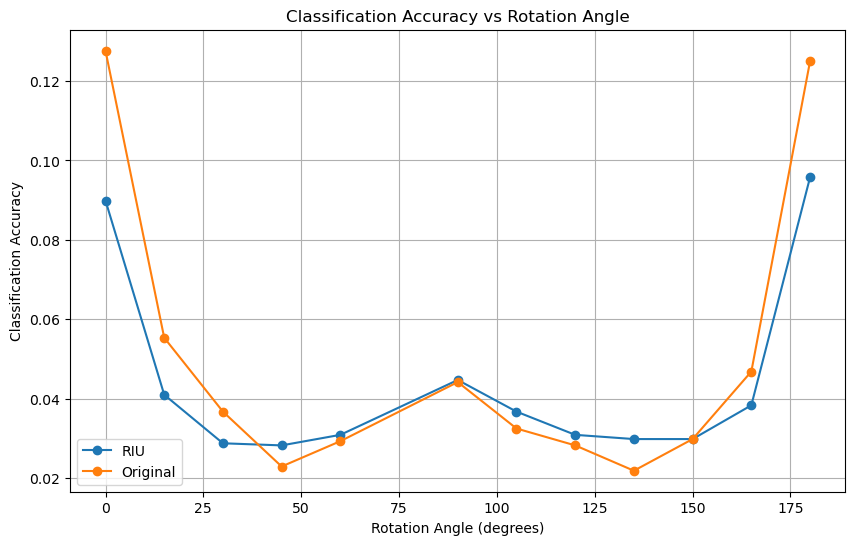

In [35]:
plt.figure(figsize=(10, 6))
plt.plot(list(rotation_accuracy_riu.keys()), list(rotation_accuracy_riu.values()), marker='o', label='RIU')
plt.plot(list(rotation_accuracy.keys()), list(rotation_accuracy.values()), marker='o', label='Original')
plt.title('Classification Accuracy vs Rotation Angle')
plt.xlabel('Rotation Angle (degrees)')
plt.ylabel('Classification Accuracy')
plt.legend()
plt.grid()
plt.show()

## Problem 2: Adaptation to Sketch Domain 

### Problem 2 (a) 

In [2]:
data_dir = "ImageNetSketch_Subset"
train_dir = os.path.join(data_dir, "train")
val_dir = os.path.join(data_dir, "val")
test_dir = os.path.join(data_dir, "test")

train_transform = transforms.Compose([
    transforms.Resize((224, 224)),  
    transforms.RandomAffine(degrees=10, translate=(0.1, 0.1), scale=(0.9, 1)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

test_transform = transforms.Compose([
    transforms.Resize((224, 224)), 
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

train_dataset = datasets.ImageFolder(train_dir, transform=train_transform)
val_dataset = datasets.ImageFolder(val_dir, transform=test_transform)
test_dataset = datasets.ImageFolder(test_dir, transform=test_transform)


batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=2)
num_classes = len(train_dataset.classes)

In [3]:
model = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
for param in model.parameters():
    param.requires_grad = True

num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, num_classes)

model = model.to(device)

trainable_params = 0
total_params = 0
for name, param in model.named_parameters():
    total_params += param.numel()
    if param.requires_grad:
        trainable_params += param.numel()

In [4]:
# Training and evaluation functions
def train_one_epoch(model, train_loader, criterion, optimizer, device):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    
    pbar = tqdm(train_loader, desc="Training")
    for images, labels in pbar:
        images, labels = images.to(device), labels.to(device)
        
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        _, predicted = outputs.max(1)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()
        
        pbar.set_postfix({'loss': running_loss/len(train_loader), 'acc': 100.*correct/total})
    
    return running_loss / len(train_loader), 100. * correct / total

def evaluate(model, data_loader, criterion, device, desc="Evaluating"):
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0
    
    with torch.no_grad():
        pbar = tqdm(data_loader, desc=desc)
        for images, labels in pbar:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            
            running_loss += loss.item()
            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()
    
    return running_loss / len(data_loader), 100. * correct / total

In [13]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=0.0001, weight_decay=1e-4)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.1)

num_epochs = 15
train_losses, train_accs = [], []
val_losses, val_accs = [], []

best_val_acc = 0.0

for epoch in range(num_epochs):
    print(f"\nEpoch {epoch+1}/{num_epochs}")
    
    train_loss, train_acc = train_one_epoch(model, train_loader, criterion, optimizer, device)
    val_loss, val_acc = evaluate(model, val_loader, criterion, device, desc="Validation")
    
    train_losses.append(train_loss)
    train_accs.append(train_acc)
    val_losses.append(val_loss)
    val_accs.append(val_acc)
    
    print(f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.2f}%")
    print(f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.2f}%")
    
    # Save best model
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save(model.state_dict(), "resnet18_sketch_finetuned.pth")
        print(f"  -> Saved best model with val acc: {val_acc:.2f}%")
    
    scheduler.step()

print(f"Training complete! Best validation accuracy: {best_val_acc:.2f}%")


Epoch 1/15


Training:   0%|          | 0/109 [00:02<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 3.7991, Train Acc: 21.93%
Val Loss: 2.6165, Val Acc: 45.66%
  -> Saved best model with val acc: 45.66%

Epoch 2/15


Training:   0%|          | 0/109 [00:01<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 2.2410, Train Acc: 57.40%
Val Loss: 1.8415, Val Acc: 59.19%
  -> Saved best model with val acc: 59.19%

Epoch 3/15


Training:   0%|          | 0/109 [00:01<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 1.4631, Train Acc: 74.46%
Val Loss: 1.3933, Val Acc: 69.29%
  -> Saved best model with val acc: 69.29%

Epoch 4/15


Training:   0%|          | 0/109 [00:01<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.9797, Train Acc: 83.95%
Val Loss: 1.1902, Val Acc: 72.53%
  -> Saved best model with val acc: 72.53%

Epoch 5/15


Training:   0%|          | 0/109 [00:01<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.6584, Train Acc: 90.16%
Val Loss: 1.0217, Val Acc: 76.57%
  -> Saved best model with val acc: 76.57%

Epoch 6/15


Training:   0%|          | 0/109 [00:01<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.4322, Train Acc: 94.83%
Val Loss: 0.9550, Val Acc: 77.78%
  -> Saved best model with val acc: 77.78%

Epoch 7/15


Training:   0%|          | 0/109 [00:01<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.3956, Train Acc: 95.30%
Val Loss: 0.9489, Val Acc: 78.18%
  -> Saved best model with val acc: 78.18%

Epoch 8/15


Training:   0%|          | 0/109 [00:01<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.3634, Train Acc: 95.96%
Val Loss: 0.9274, Val Acc: 79.39%
  -> Saved best model with val acc: 79.39%

Epoch 9/15


Training:   0%|          | 0/109 [00:01<?, ?it/s]

IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out


Validation:   0%|          | 0/16 [00:36<?, ?it/s]

Train Loss: 0.3447, Train Acc: 95.99%
Val Loss: 0.9249, Val Acc: 79.80%
  -> Saved best model with val acc: 79.80%

Epoch 10/15


Training:   0%|          | 0/109 [00:01<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.3315, Train Acc: 95.96%
Val Loss: 0.9087, Val Acc: 79.39%

Epoch 11/15


Training:   0%|          | 0/109 [00:01<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.3134, Train Acc: 96.54%
Val Loss: 0.9149, Val Acc: 79.80%

Epoch 12/15


Training:   0%|          | 0/109 [00:01<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.3078, Train Acc: 96.39%
Val Loss: 0.9131, Val Acc: 78.79%

Epoch 13/15


Training:   0%|          | 0/109 [00:01<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.3155, Train Acc: 96.42%
Val Loss: 0.9005, Val Acc: 81.21%
  -> Saved best model with val acc: 81.21%

Epoch 14/15


Training:   0%|          | 0/109 [00:01<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.3054, Train Acc: 96.54%
Val Loss: 0.9098, Val Acc: 79.39%

Epoch 15/15


Training:   0%|          | 0/109 [00:01<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.3080, Train Acc: 96.48%
Val Loss: 0.8959, Val Acc: 80.00%
Training complete! Best validation accuracy: 81.21%


In [39]:
# Save training curves
np.save('P02c_train_losses.npy', np.array(train_losses))
np.save('P02c_train_accs.npy', np.array(train_accs))
np.save('P02c_val_losses.npy', np.array(val_losses))
np.save('P02c_val_accs.npy', np.array(val_accs))

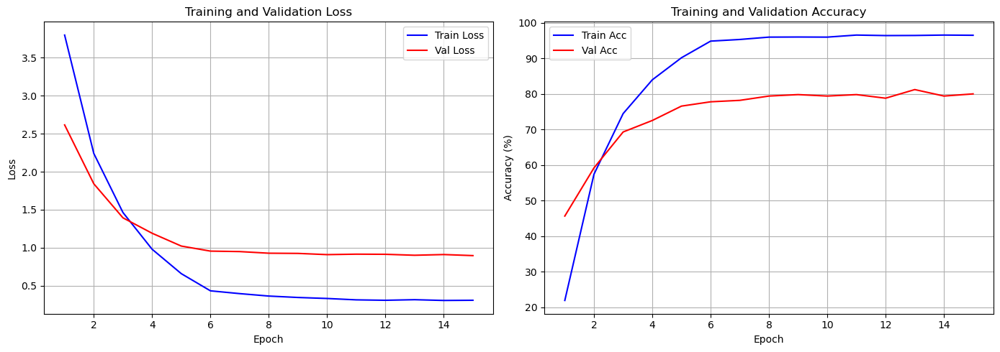

In [14]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].plot(range(1, num_epochs+1), train_losses, 'b-', label='Train Loss')
axes[0].plot(range(1, num_epochs+1), val_losses, 'r-', label='Val Loss')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].set_title('Training and Validation Loss')
axes[0].legend()
axes[0].grid(True)

axes[1].plot(range(1, num_epochs+1), train_accs, 'b-', label='Train Acc')
axes[1].plot(range(1, num_epochs+1), val_accs, 'r-', label='Val Acc')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Accuracy (%)')
axes[1].set_title('Training and Validation Accuracy')
axes[1].legend()
axes[1].grid(True)

plt.tight_layout()
# plt.savefig('problem2a_training_curves.png', dpi=150)
plt.show()

In [15]:
model.load_state_dict(torch.load("resnet18_sketch_finetuned.pth"))
test_loss, test_acc = evaluate(model, test_loader, criterion, device, desc="Test Evaluation")

print(f"Final Training Accuracy: {train_accs[-1]:.2f}%")
print(f"Final Validation Accuracy: {val_accs[-1]:.2f}%")
print(f"Test Accuracy: {test_acc:.2f}%")

Test Evaluation:   0%|          | 0/34 [00:00<?, ?it/s]

Final Training Accuracy: 96.48%
Final Validation Accuracy: 80.00%
Test Accuracy: 80.04%


### Problem 2 (b) - Feature Map Visualization

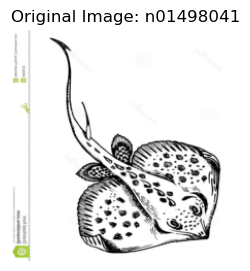


layer1 - Shape: 64 channels x 56x56


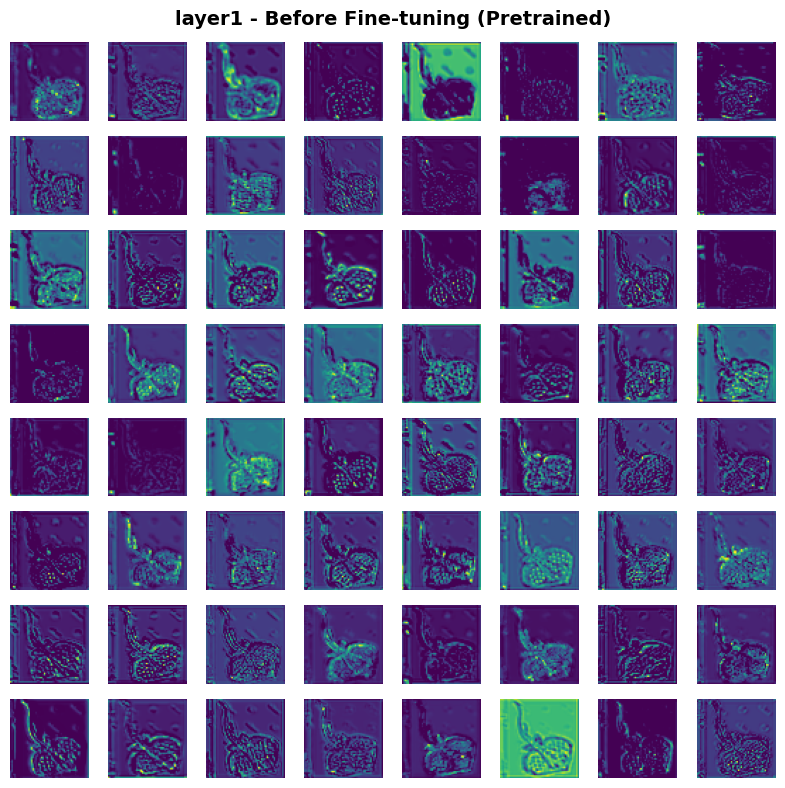

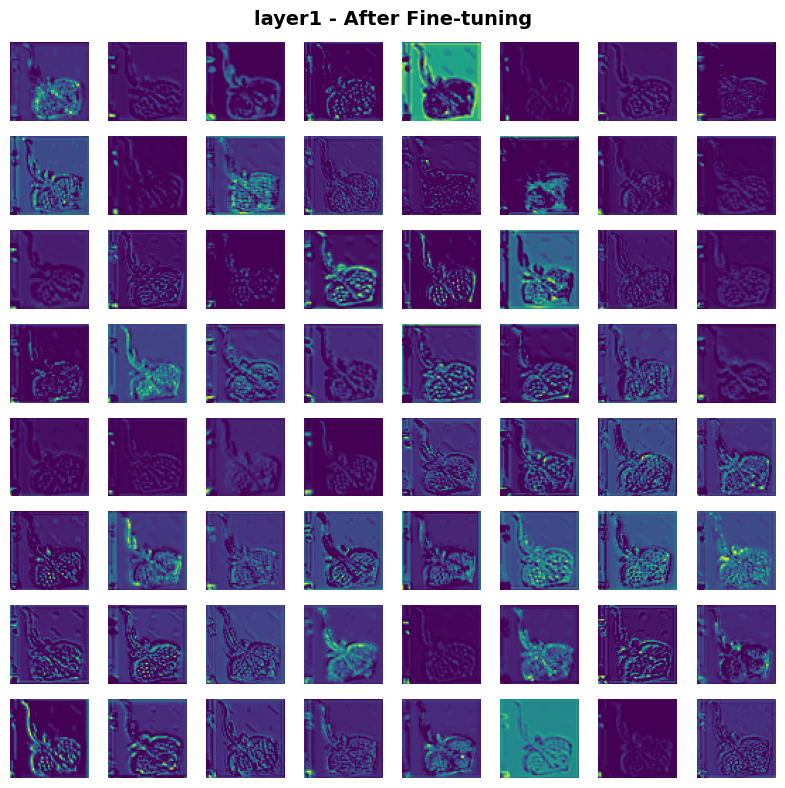


layer2 - Shape: 128 channels x 28x28


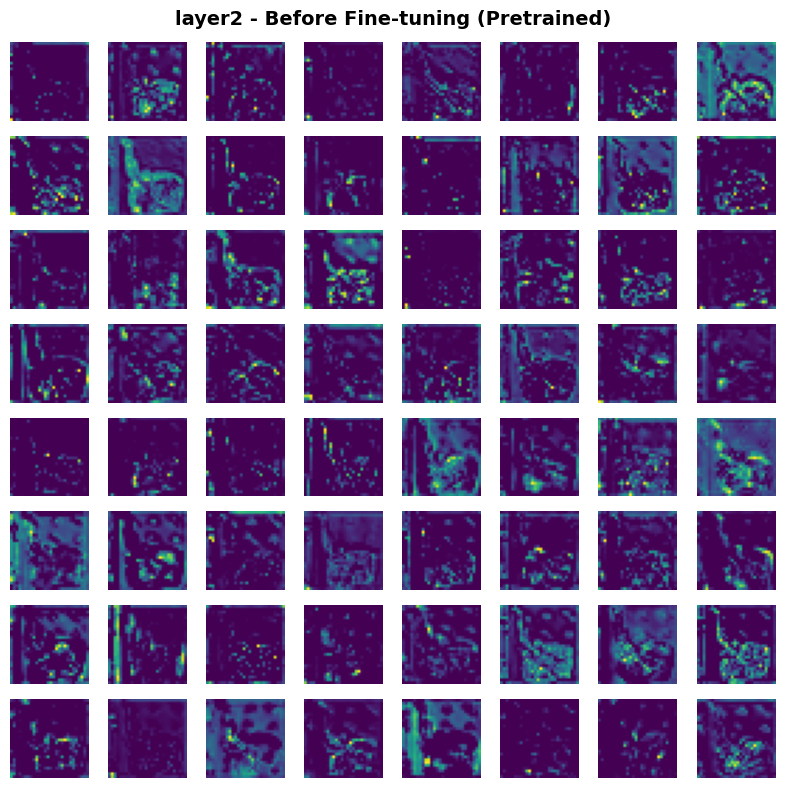

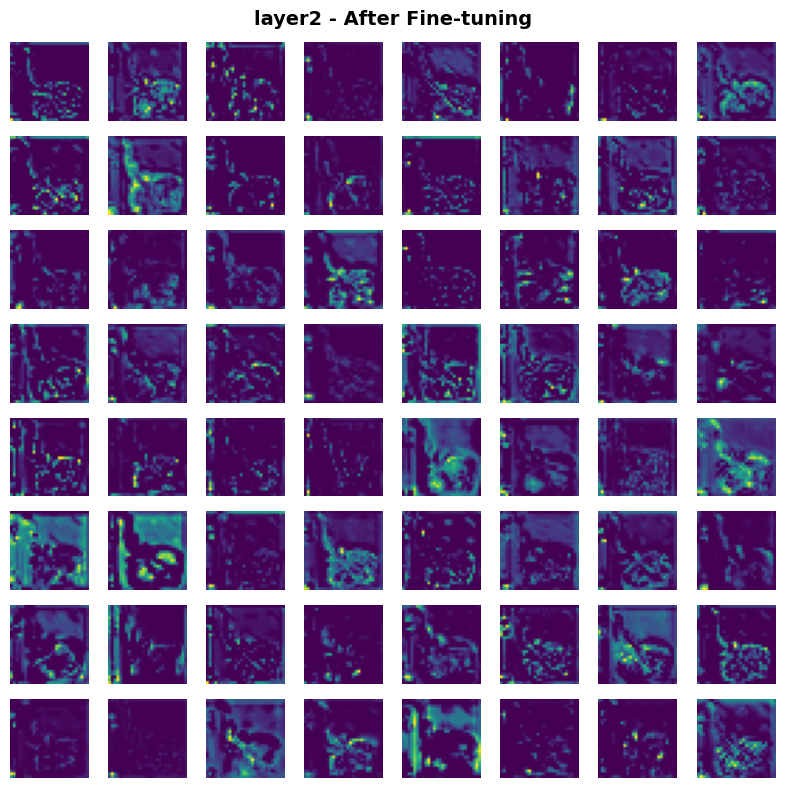


layer3 - Shape: 256 channels x 14x14


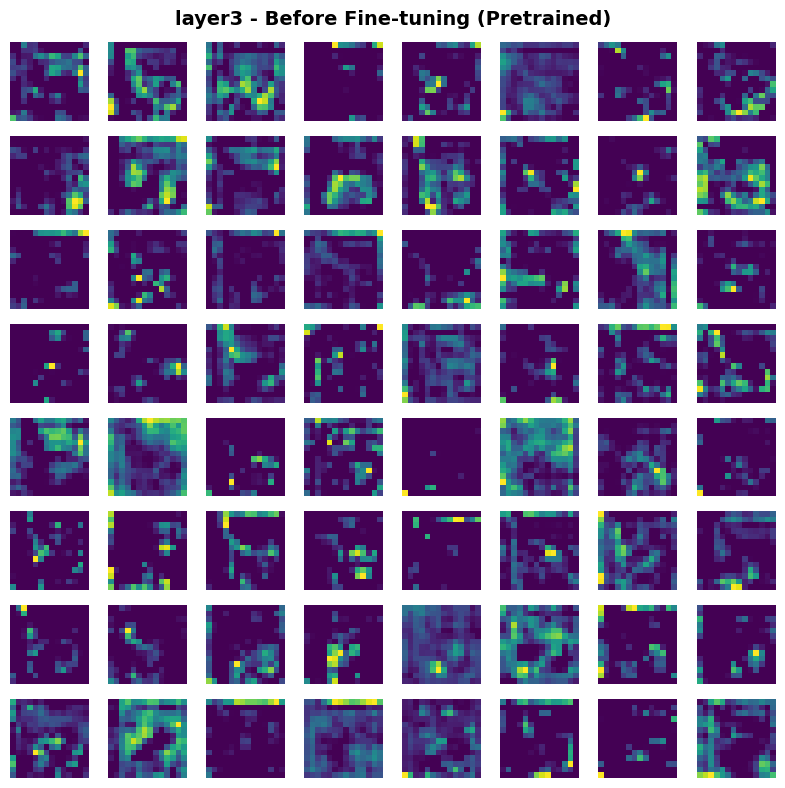

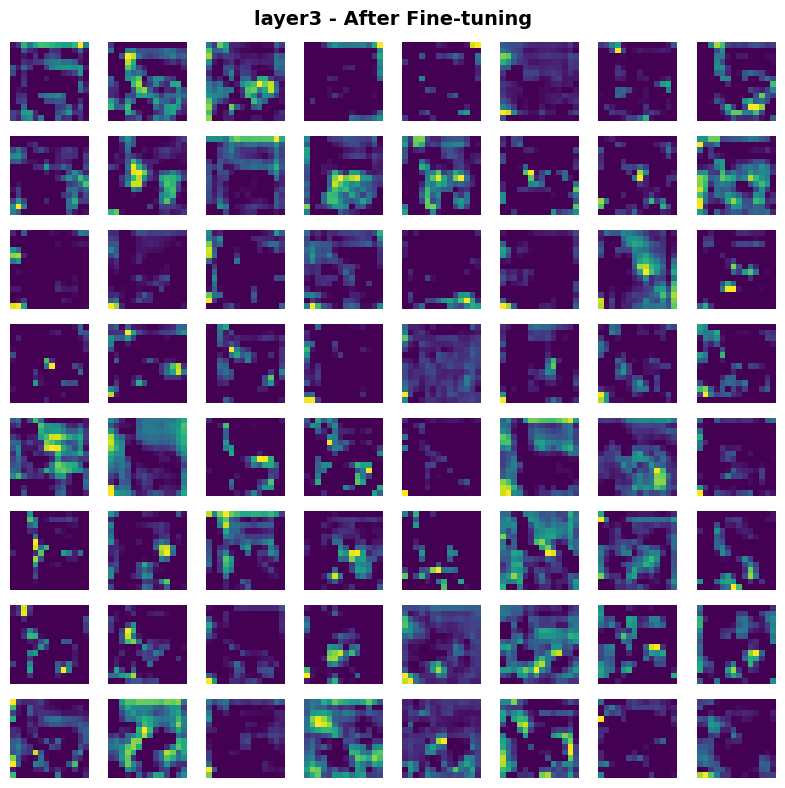


layer4 - Shape: 512 channels x 7x7


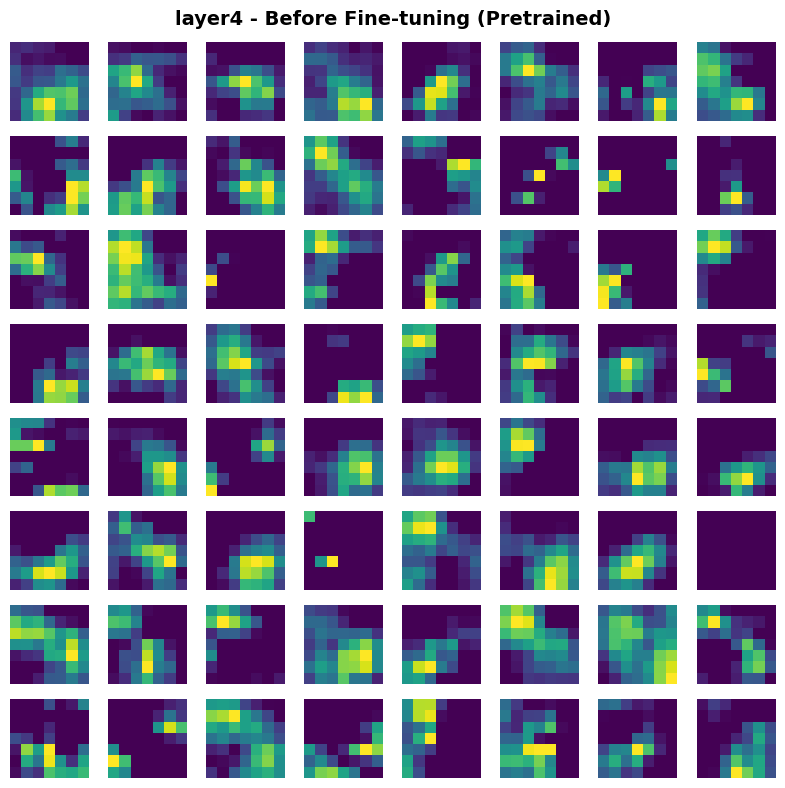

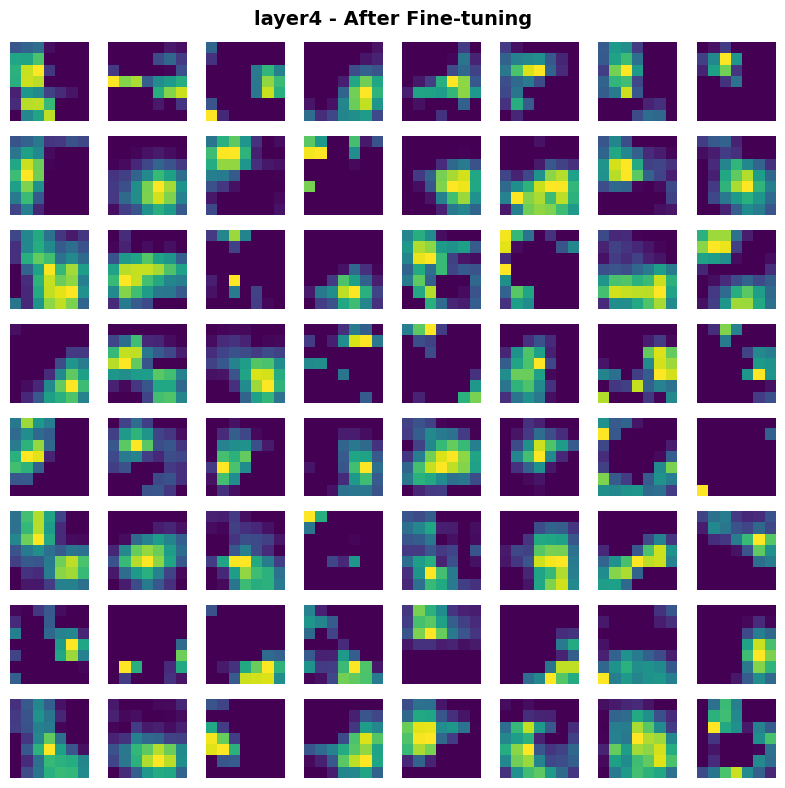

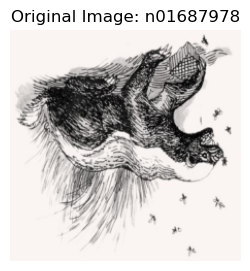


layer1 - Shape: 64 channels x 56x56


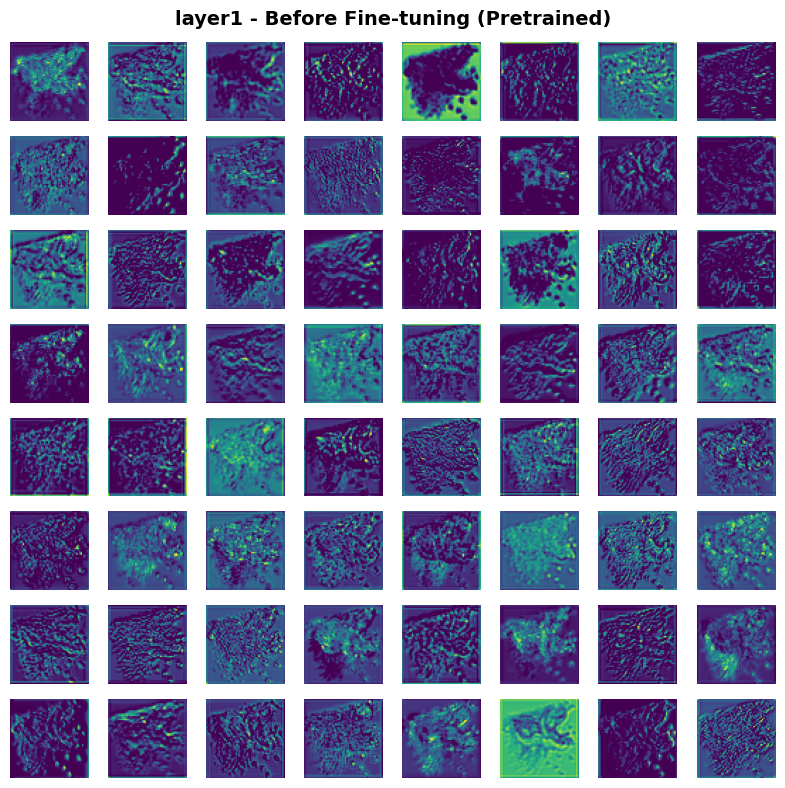

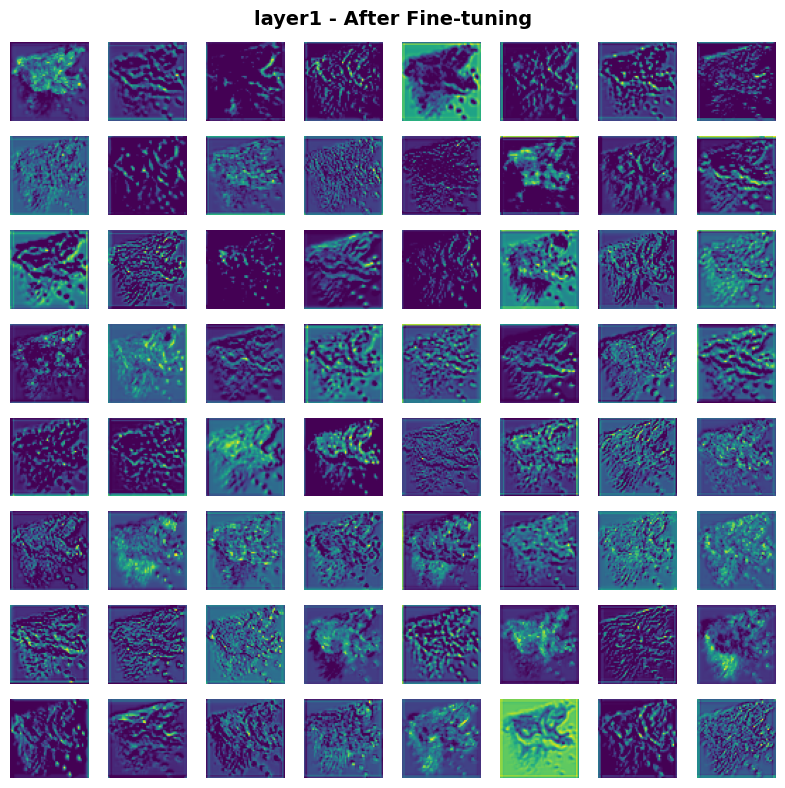


layer2 - Shape: 128 channels x 28x28


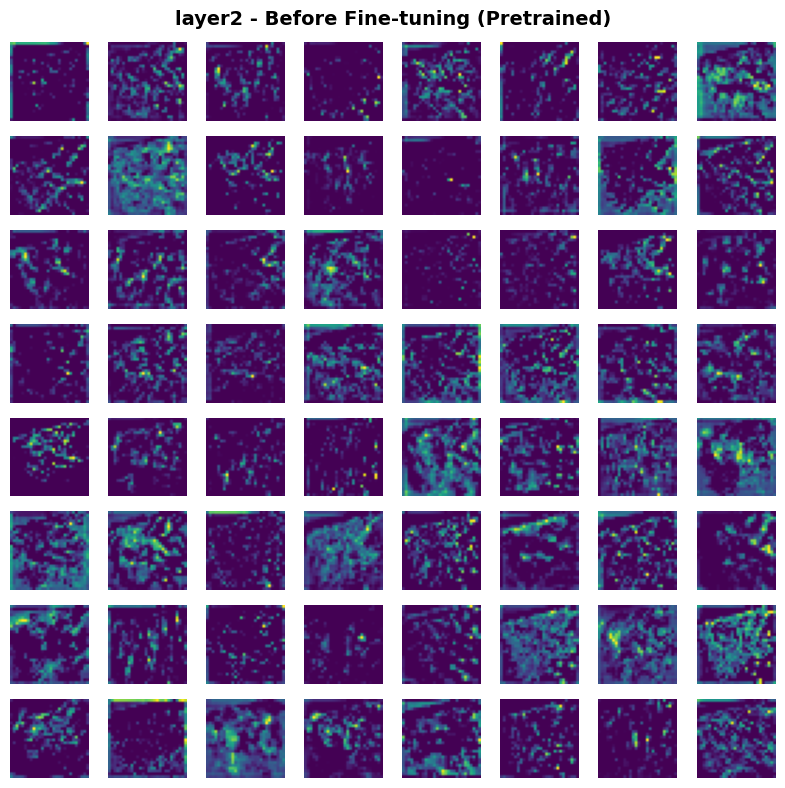

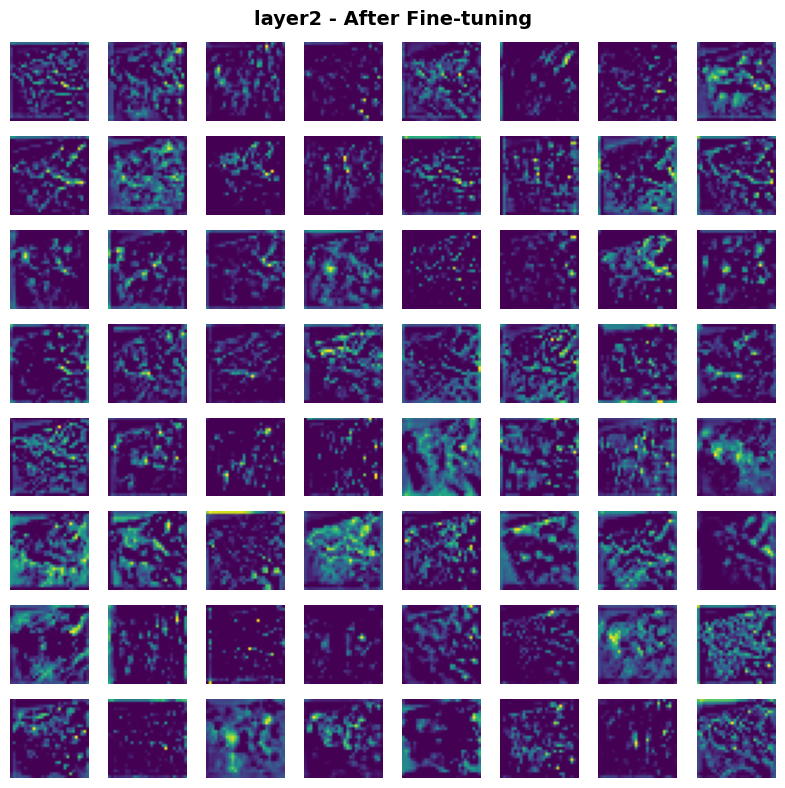


layer3 - Shape: 256 channels x 14x14


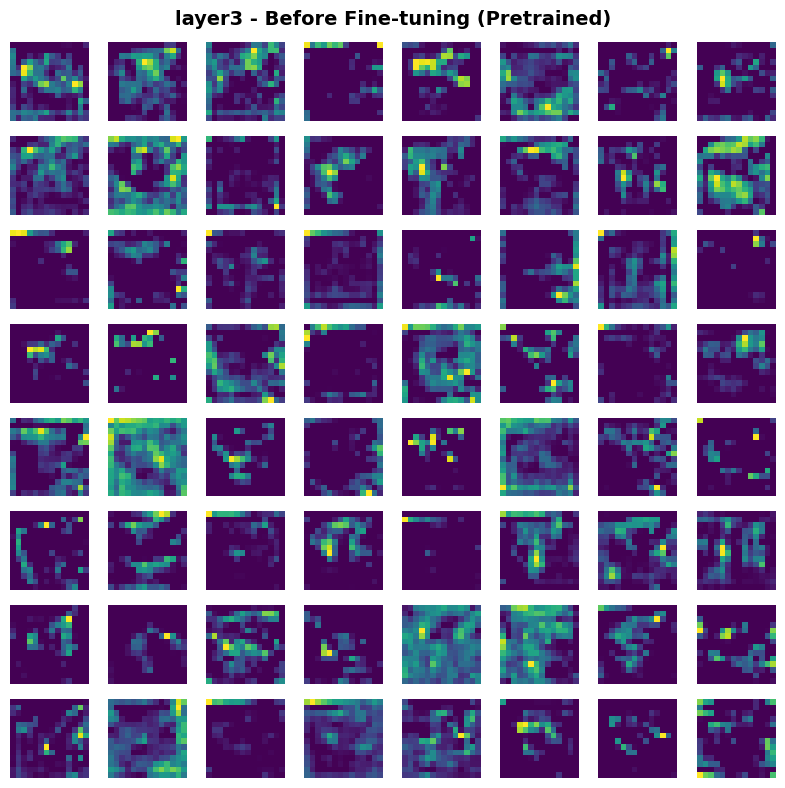

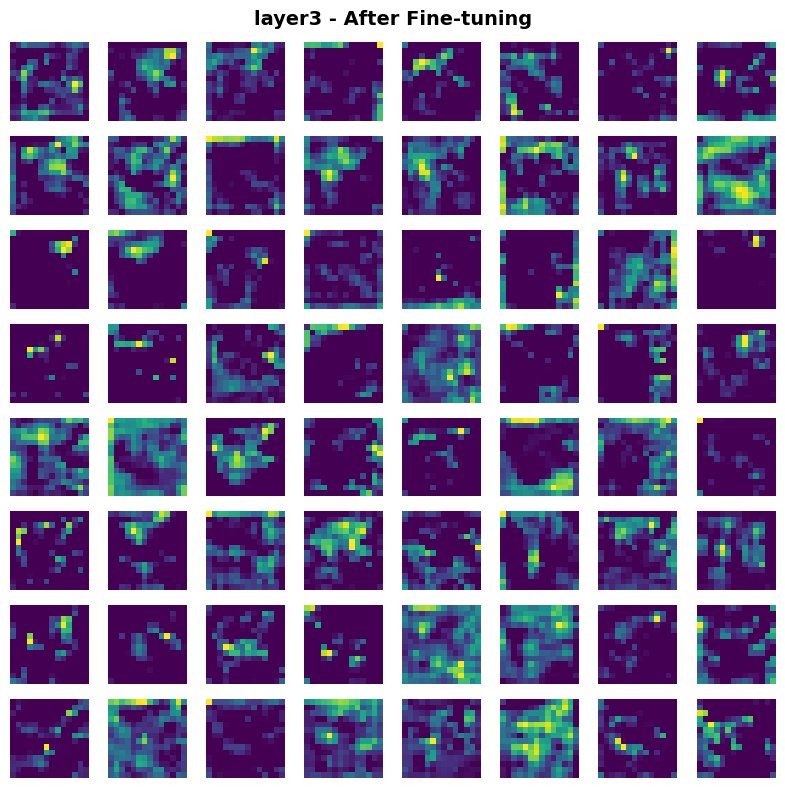


layer4 - Shape: 512 channels x 7x7


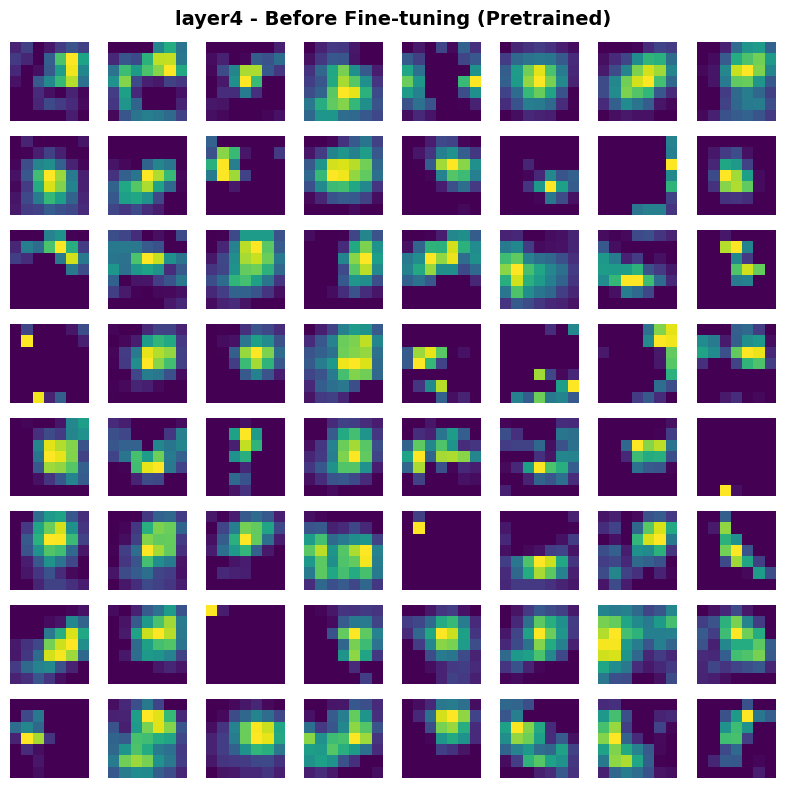

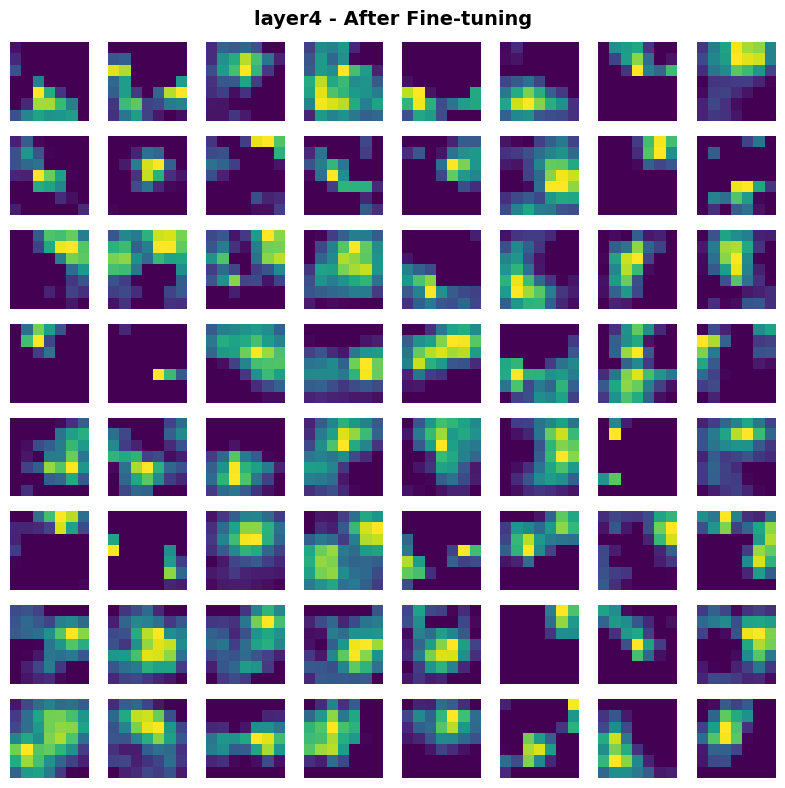

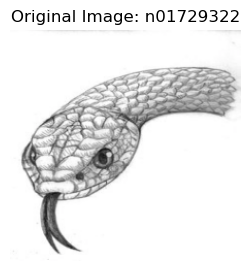


layer1 - Shape: 64 channels x 56x56


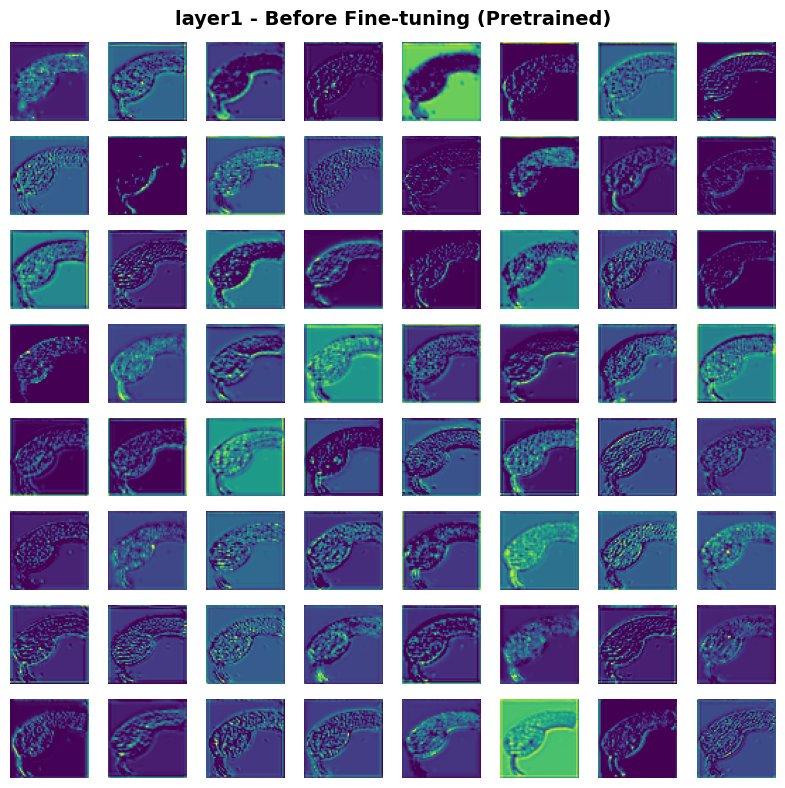

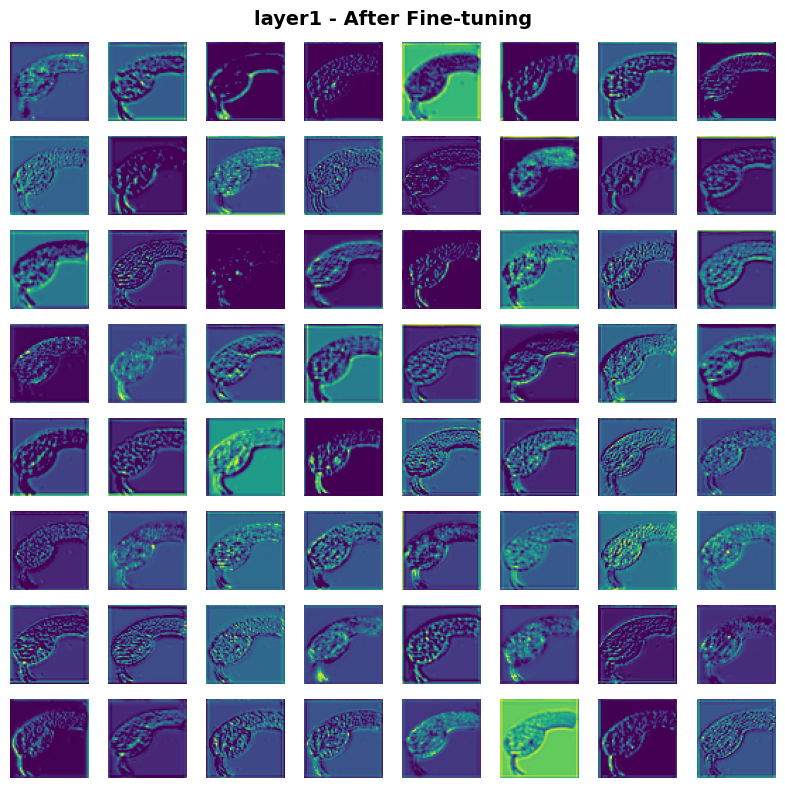


layer2 - Shape: 128 channels x 28x28


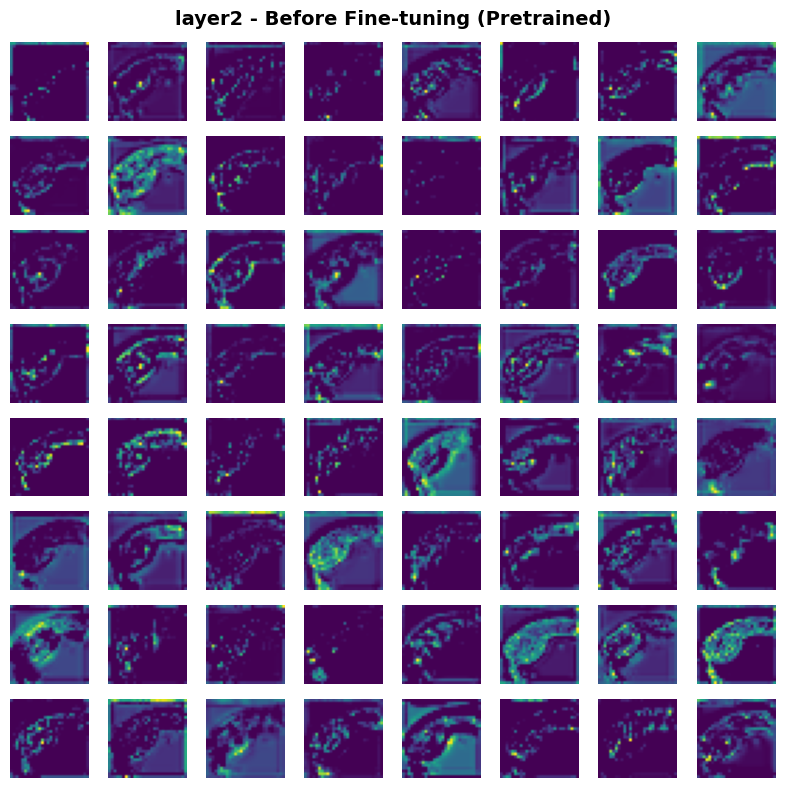

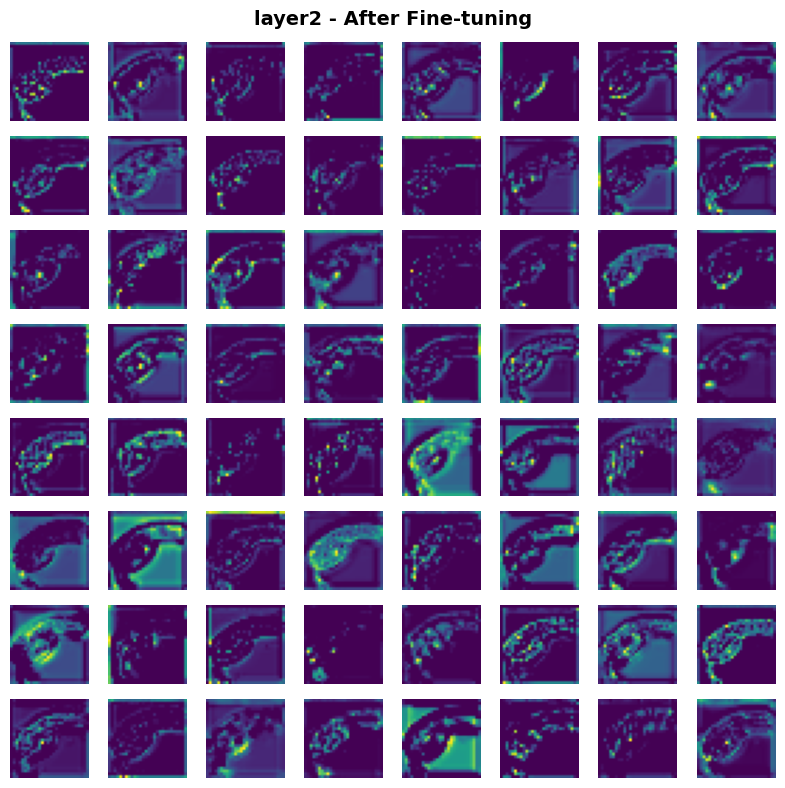


layer3 - Shape: 256 channels x 14x14


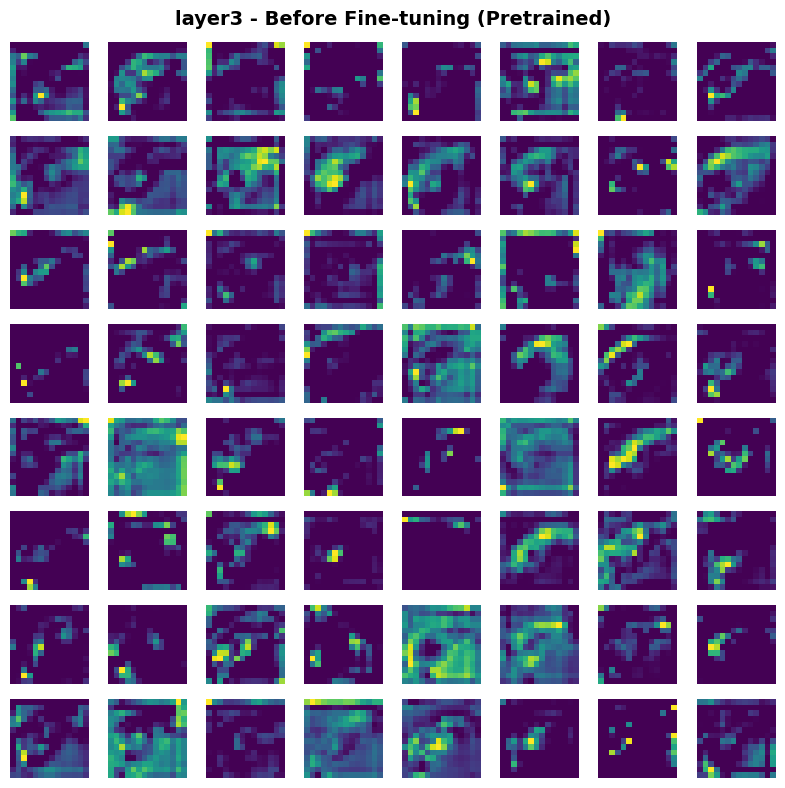

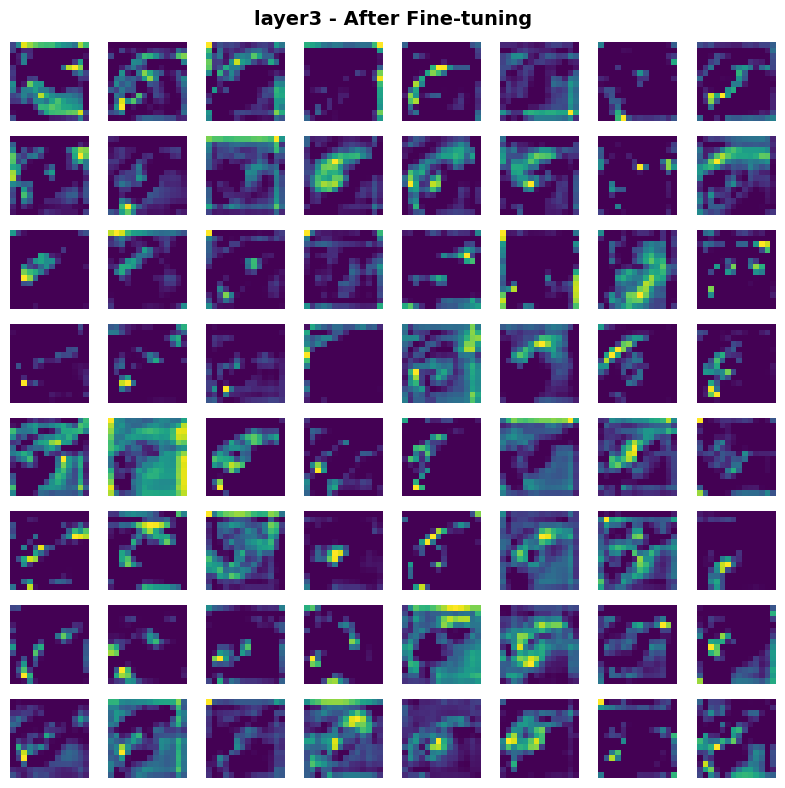


layer4 - Shape: 512 channels x 7x7


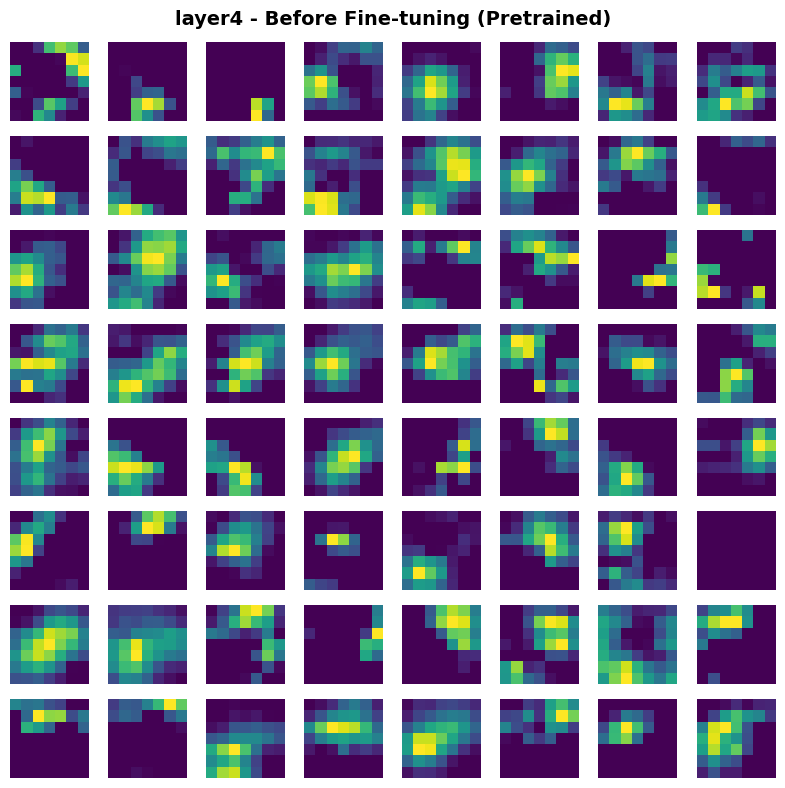

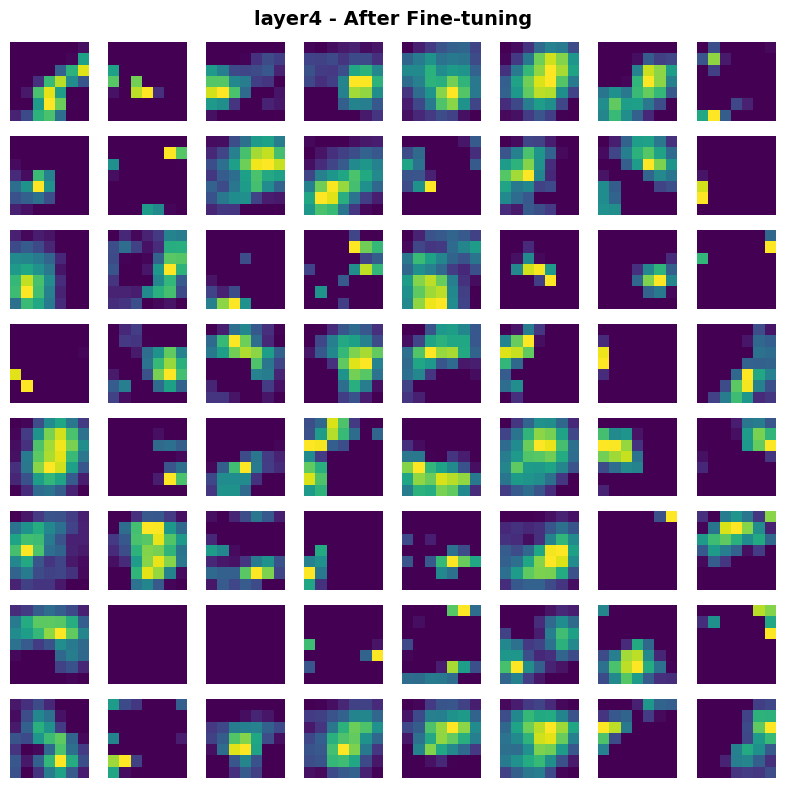

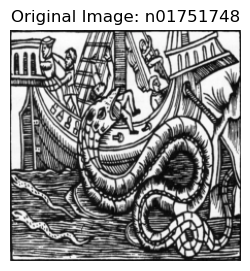


layer1 - Shape: 64 channels x 56x56


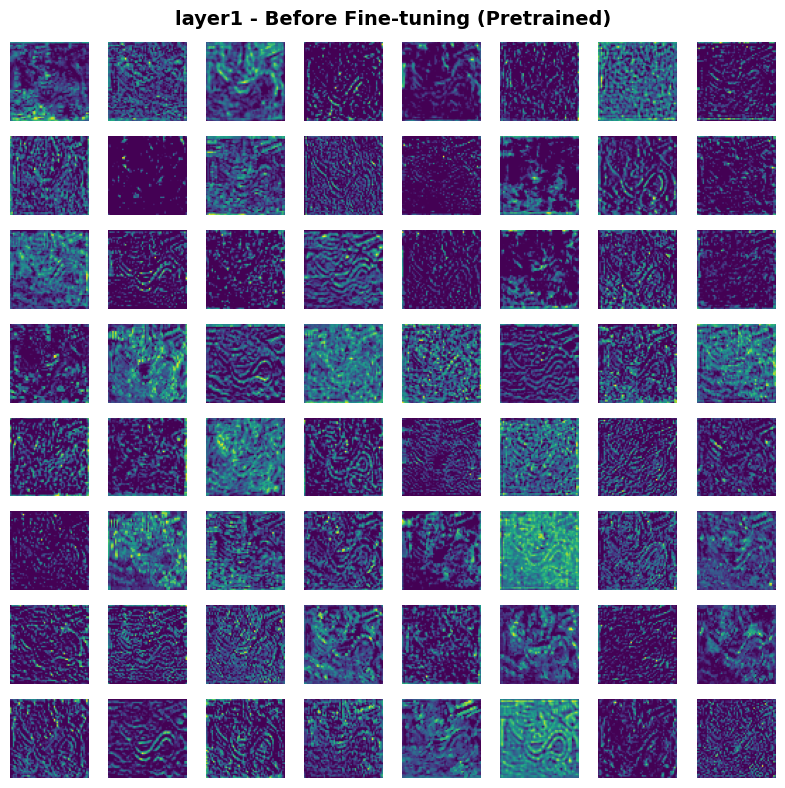

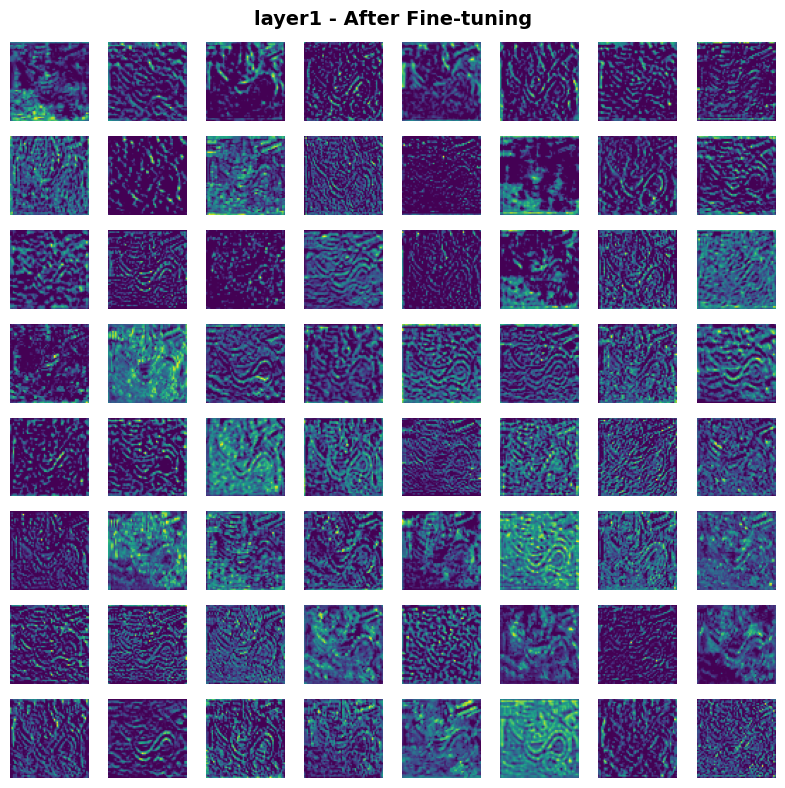


layer2 - Shape: 128 channels x 28x28


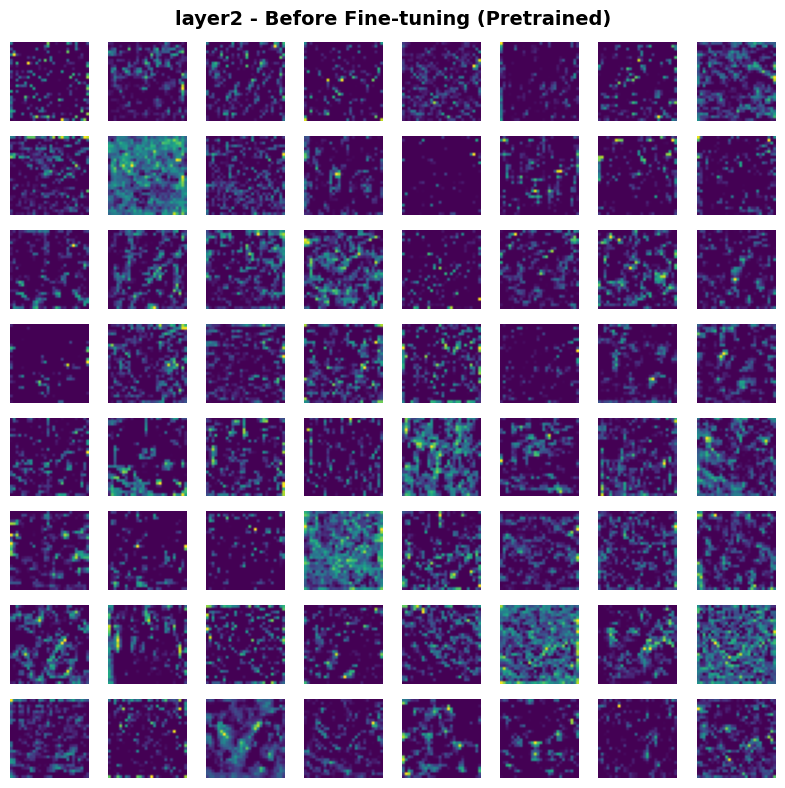

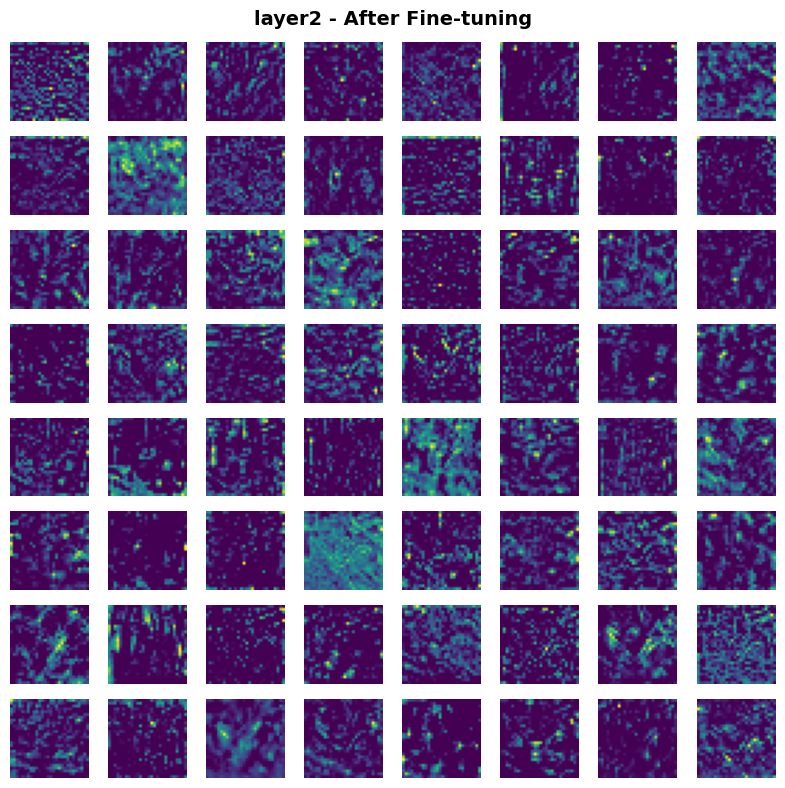


layer3 - Shape: 256 channels x 14x14


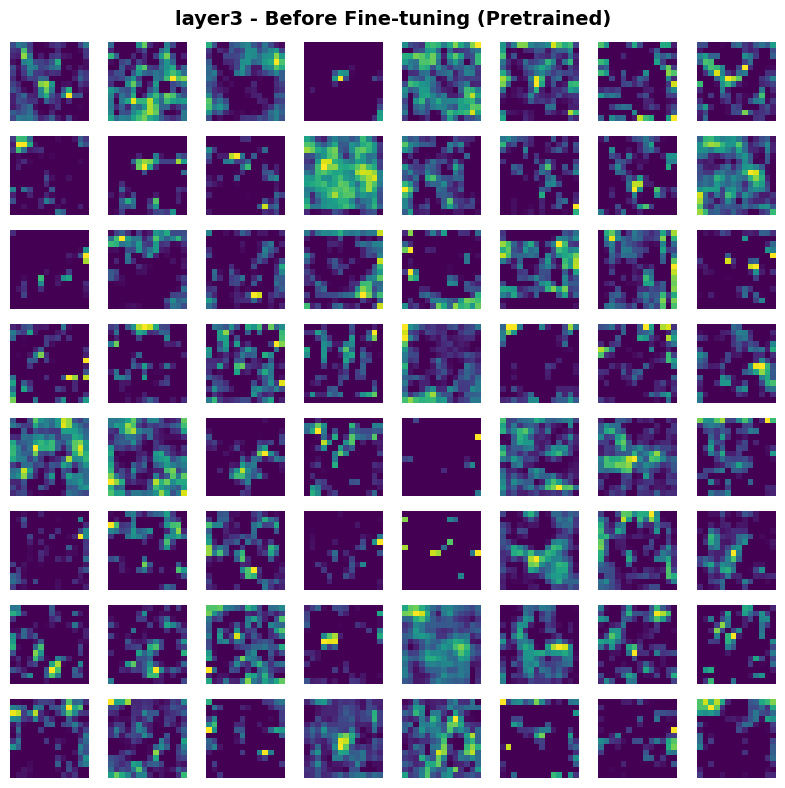

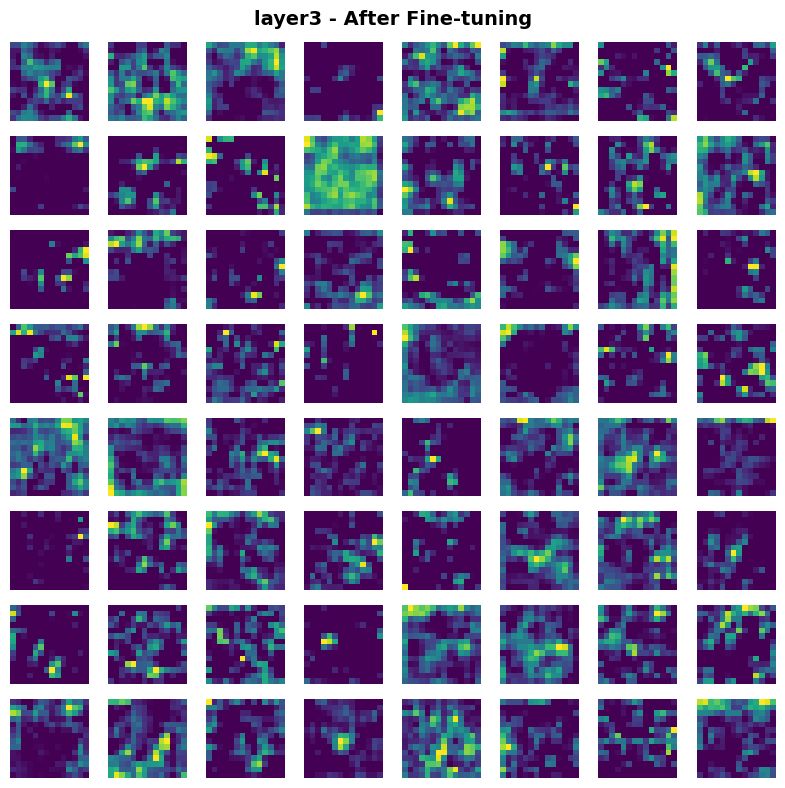


layer4 - Shape: 512 channels x 7x7


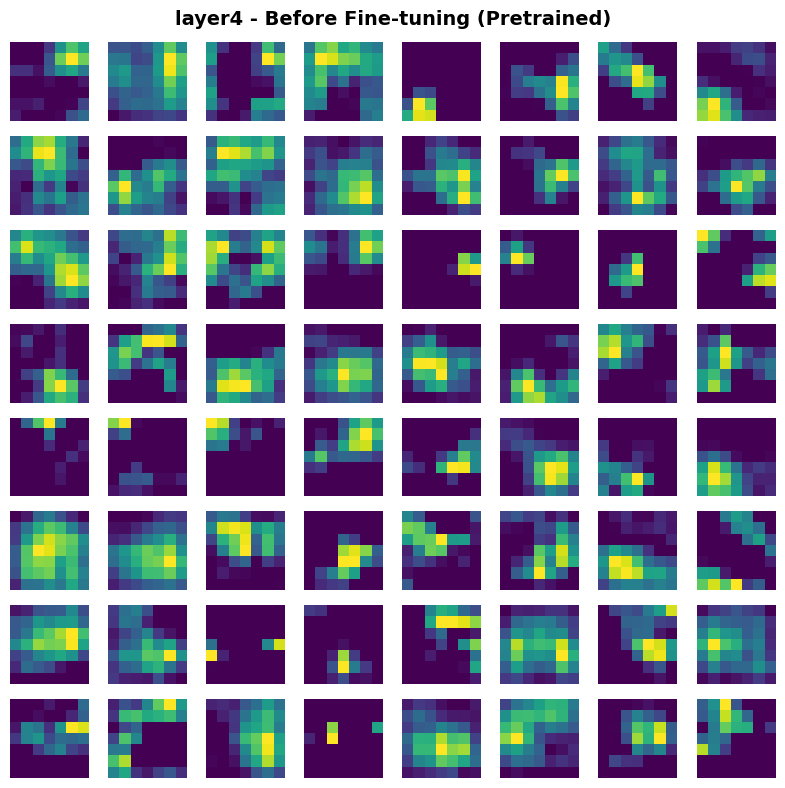

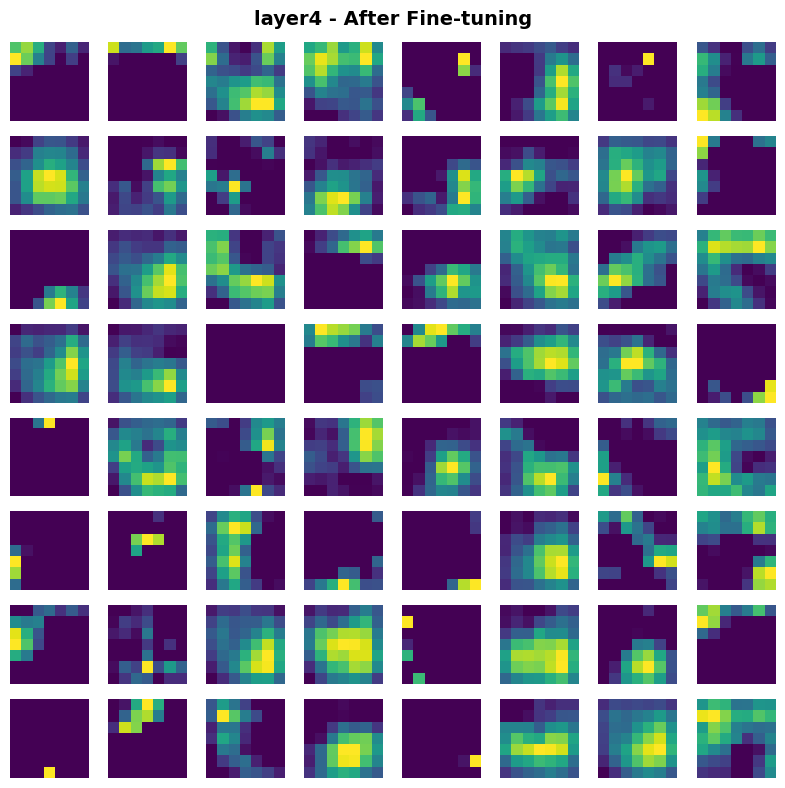

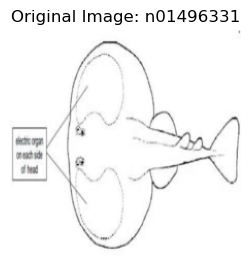


layer1 - Shape: 64 channels x 56x56


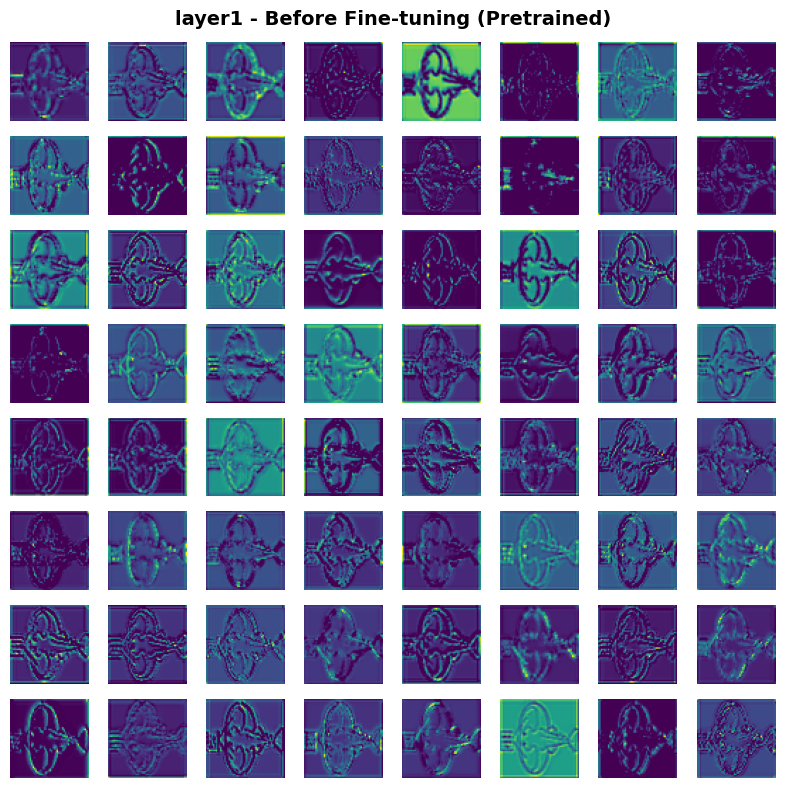

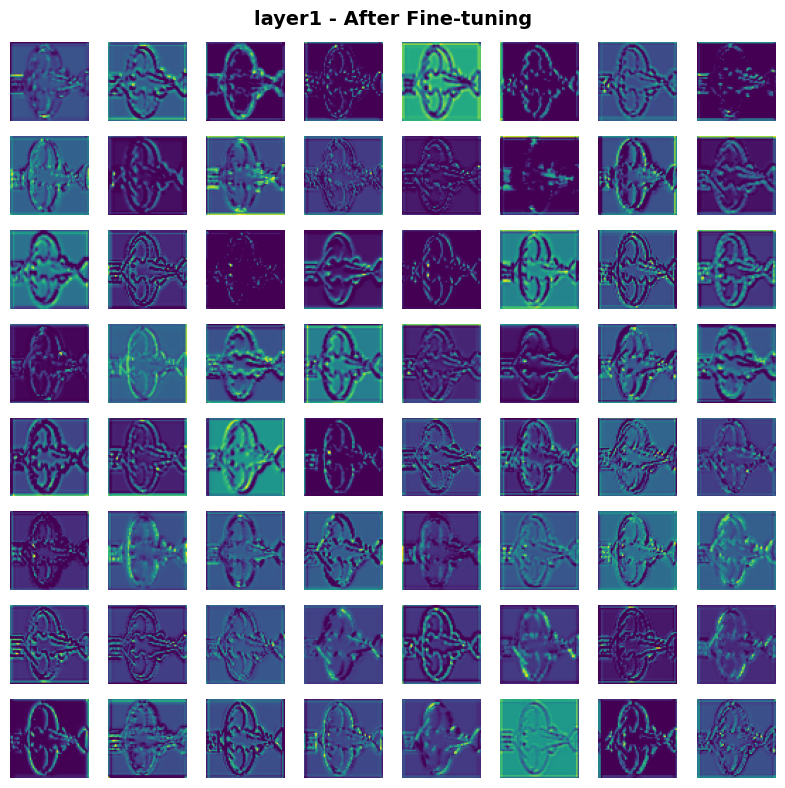


layer2 - Shape: 128 channels x 28x28


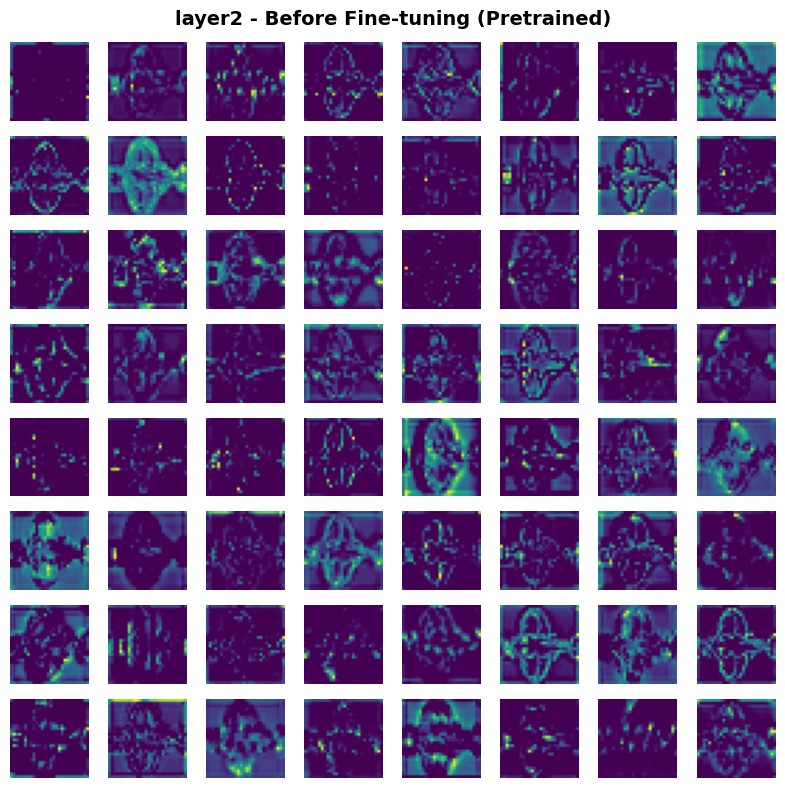

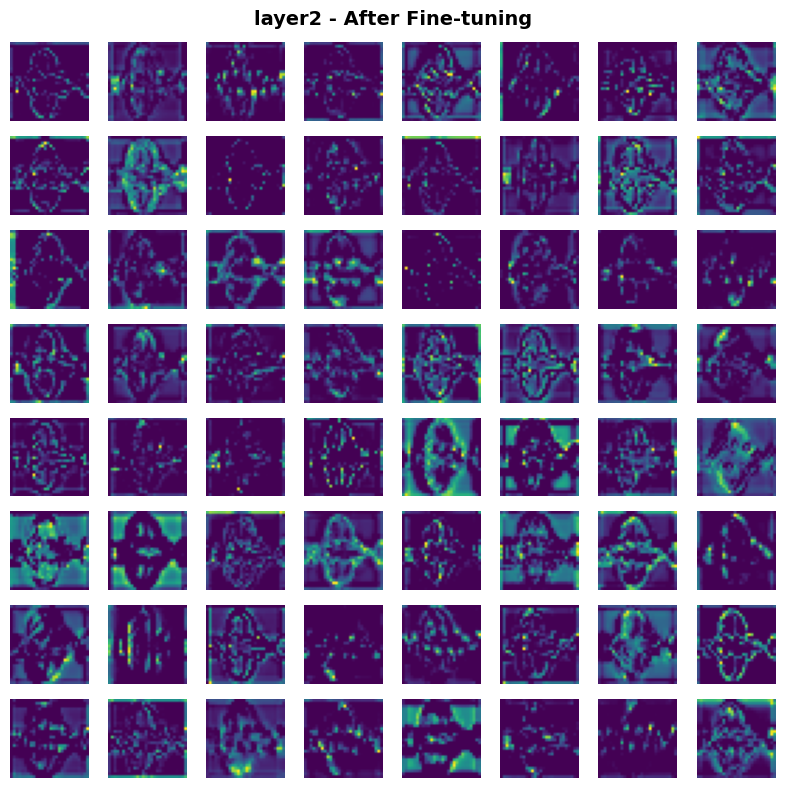


layer3 - Shape: 256 channels x 14x14


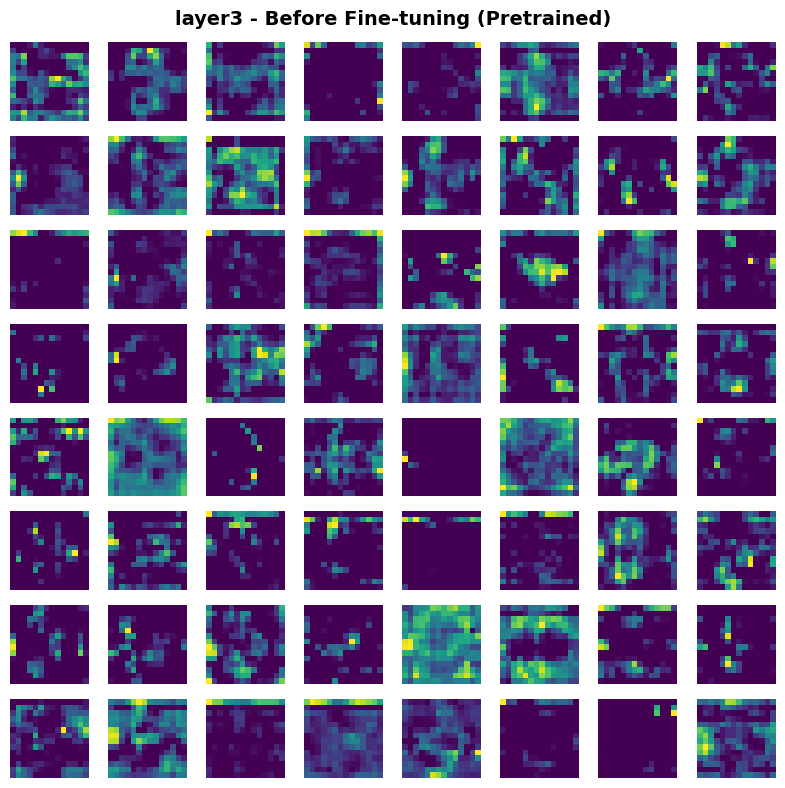

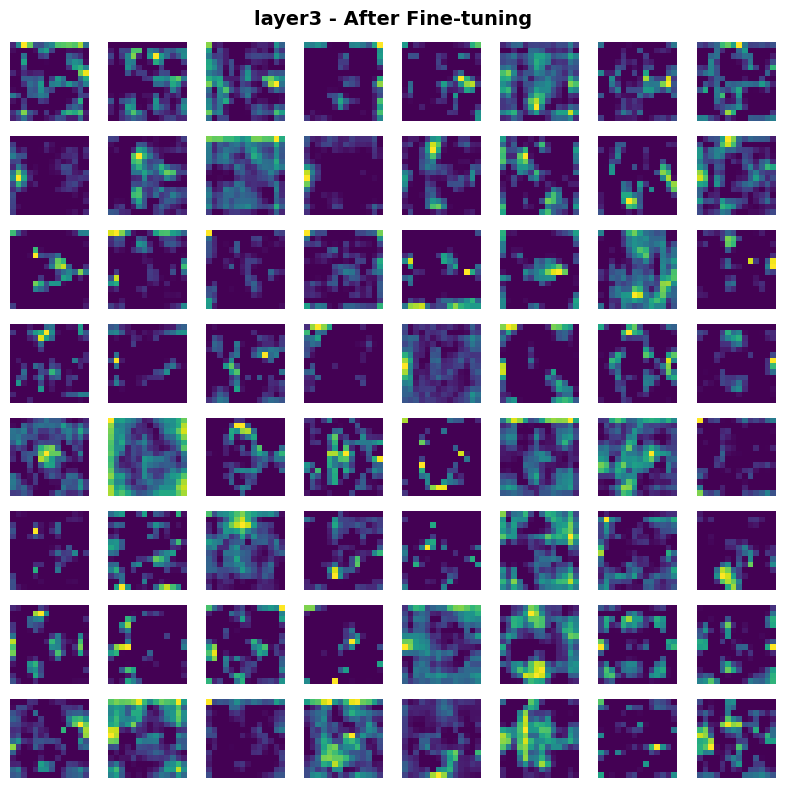


layer4 - Shape: 512 channels x 7x7


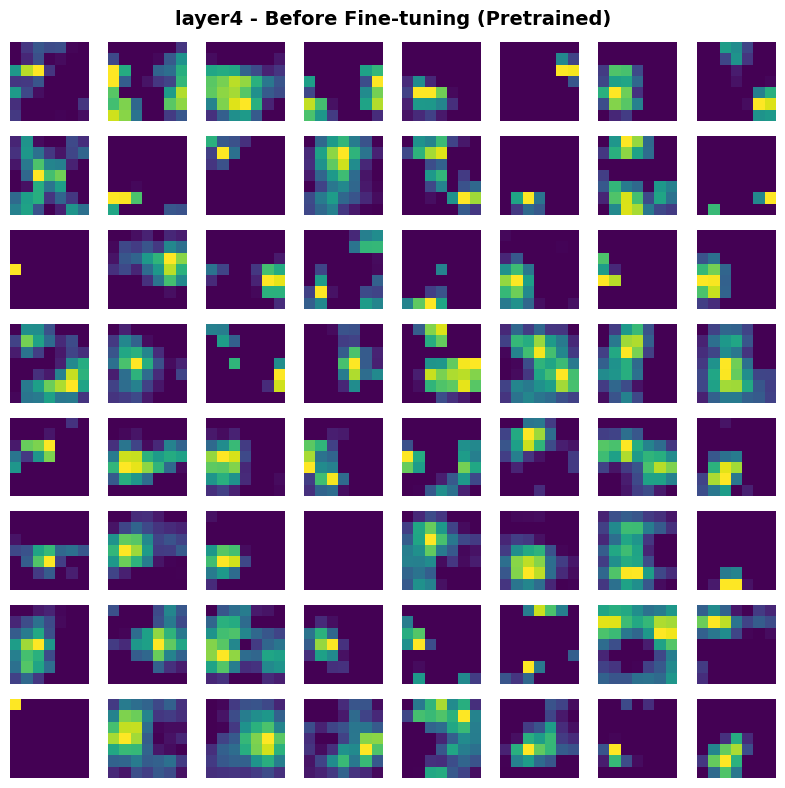

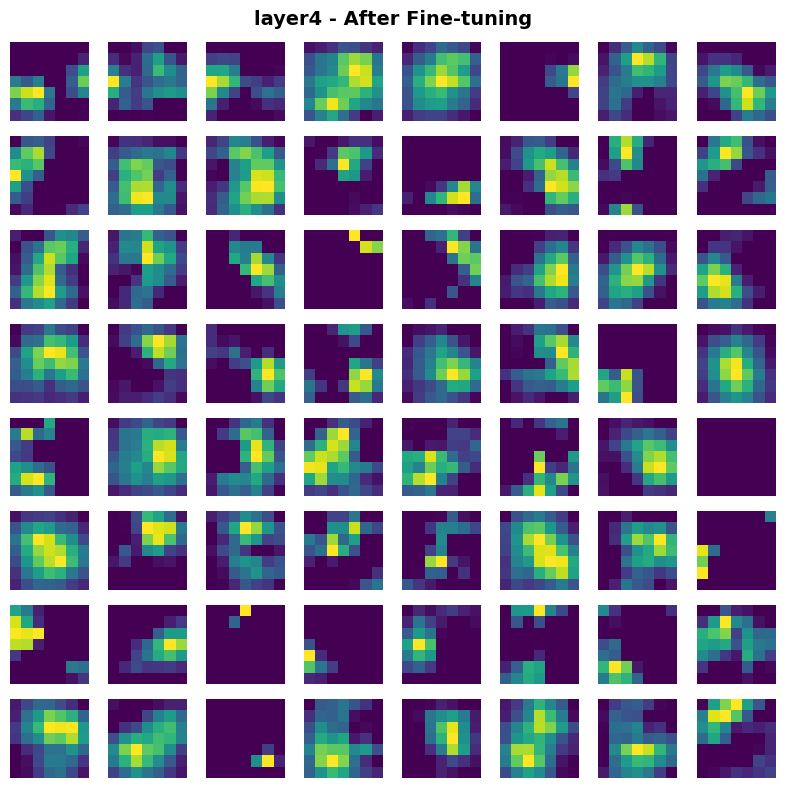

In [37]:
# Feature Map Visualization Functions (adapted from https://gcerar.github.io/posts/2025-05-06-feature-maps/)


def get_activation(name: str, activations: dict) -> Callable:
    """Hook function to capture layer activations."""
    def hook(model: nn.Module, input: Tensor, output: Tensor) -> None:
        activations[name] = output.detach()
    return hook

def set_hooks(model: nn.Module, layer_names: list, activations: dict) -> list:
    """Register forward hooks on specified layers."""
    hooks = []
    for name, module in model.named_modules():
        if name in layer_names:
            hook = module.register_forward_hook(get_activation(name, activations))
            hooks.append(hook)
    return hooks

def visualize_feature_maps(
    feature_map: Tensor,
    max_maps: int = 64,
    max_cols: int = 8,
    figsize_per_plot: float = 1.0,
    cmap: str = "viridis",
    title: str = "",
    save_path: str = None
):
    """Visualize feature maps as a grid of heatmaps (website style)."""
    if isinstance(feature_map, Tensor):
        feature_map = feature_map.cpu().numpy()
    
    # Remove batch dimension if present
    if feature_map.ndim == 4:
        feature_map = feature_map[0]
    
    num_channels = min(feature_map.shape[0], max_maps)
    num_rows = (num_channels + max_cols - 1) // max_cols
    
    fig, axes = plt.subplots(num_rows, max_cols, 
                              figsize=(max_cols * figsize_per_plot, num_rows * figsize_per_plot))
    axes = np.atleast_2d(axes)
    
    for i in range(num_rows * max_cols):
        row, col = i // max_cols, i % max_cols
        if i < num_channels:
            axes[row, col].imshow(feature_map[i], cmap=cmap)
        axes[row, col].axis('off')
    
    if title:
        fig.suptitle(title, fontsize=14, fontweight='bold')
    plt.tight_layout()
    
    # Save BEFORE show (important!)
    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
    
    plt.show()

def get_feature_maps(model, image_tensor, layer_names, device):
    """Extract feature maps from specified layers for a given image."""
    activations = {}
    hooks = set_hooks(model, layer_names, activations)
    
    model.eval()
    with torch.no_grad():
        image_tensor = image_tensor.to(device)
        if image_tensor.dim() == 3:
            image_tensor = image_tensor.unsqueeze(0)
        _ = model(image_tensor)
    
    # Remove hooks
    for hook in hooks:
        hook.remove()
    
    return activations


model_pretrained = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
num_ftrs_pre = model_pretrained.fc.in_features
model_pretrained.fc = nn.Linear(num_ftrs_pre, num_classes)
model_pretrained = model_pretrained.to(device)
model_pretrained.eval()

model_finetuned = models.resnet18(weights=None)
num_ftrs_ft = model_finetuned.fc.in_features
model_finetuned.fc = nn.Linear(num_ftrs_ft, num_classes)
model_finetuned.load_state_dict(torch.load("resnet18_sketch_finetuned.pth", map_location=device))
model_finetuned = model_finetuned.to(device)
model_finetuned.eval()

layer_names = ['layer1', 'layer2', 'layer3', 'layer4']

np.random.seed(42)
random_indices = np.random.choice(len(test_dataset), 5, replace=False)

mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)

for idx, sample_idx in enumerate(random_indices):
    image_tensor, label = test_dataset[sample_idx]
    class_name = test_dataset.classes[label]
    

    activations_pretrained = get_feature_maps(model_pretrained, image_tensor, layer_names, device)
    activations_finetuned = get_feature_maps(model_finetuned, image_tensor, layer_names, device)
    

    img_display = image_tensor.cpu() * std + mean
    img_display = img_display.permute(1, 2, 0).numpy().clip(0, 1)
    
    
    plt.figure(figsize=(3, 3))
    plt.imshow(img_display)
    plt.title(f"Original Image: {class_name}", fontsize=12)
    plt.axis('off')
    plt.savefig(f'P02b_original_{class_name}_{idx+1}.png', dpi=150, bbox_inches='tight')
    plt.show()
    

    for layer_name in layer_names:
        fm_pre = activations_pretrained[layer_name]
        fm_ft = activations_finetuned[layer_name]
        
        print(f"\n{layer_name} - Shape: {fm_pre.shape[1]} channels x {fm_pre.shape[2]}x{fm_pre.shape[3]}")
        
        # Pretrained model feature maps
        visualize_feature_maps(
            fm_pre,
            max_maps=64,
            max_cols=8,
            figsize_per_plot=1.0,
            cmap='viridis',
            title=f"{layer_name} - Before Fine-tuning (Pretrained)",
            save_path=f'P02b_feature_maps_{class_name}_{idx+1}_{layer_name}_pretrained.png'
        )
        
        # Fine-tuned model feature maps
        visualize_feature_maps(
            fm_ft,
            max_maps=64,
            max_cols=8,
            figsize_per_plot=1.0,
            cmap='viridis',
            title=f"{layer_name} - After Fine-tuning",
            save_path=f'P02b_feature_maps_{class_name}_{idx+1}_{layer_name}_finetuned.png'
        )


### Problem 2 (c) - BatchNorm Only Fine-tuning

Fine-tune ResNet18 with all parameters frozen EXCEPT BatchNorm layers. Only update BatchNorm parameters (gamma/weight and beta/bias).

In [5]:
model_bn = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)

for param in model_bn.parameters():
    param.requires_grad = False

for name, module in model_bn.named_modules():
    if isinstance(module, nn.BatchNorm2d):
        for param in module.parameters():
            param.requires_grad = True

num_ftrs = model_bn.fc.in_features
model_bn.fc = nn.Linear(num_ftrs, num_classes)

model_bn = model_bn.to(device)


trainable_params_bn = 0
total_params_bn = 0
for name, param in model_bn.named_parameters():
    total_params_bn += param.numel()
    if param.requires_grad:
        trainable_params_bn += param.numel()

In [6]:
criterion_bn = nn.CrossEntropyLoss()
optimizer_bn = optim.Adam(filter(lambda p: p.requires_grad, model_bn.parameters()), lr=0.001, weight_decay=1e-4)
scheduler_bn = optim.lr_scheduler.StepLR(optimizer_bn, step_size=5, gamma=0.1)

num_epochs_bn = 15
train_losses_bn, train_accs_bn = [], []
val_losses_bn, val_accs_bn = [], []
best_val_acc_bn = 0.0


for epoch in range(num_epochs_bn):
    print(f"\nEpoch {epoch+1}/{num_epochs_bn}")
    
    train_loss, train_acc = train_one_epoch(model_bn, train_loader, criterion_bn, optimizer_bn, device)
    val_loss, val_acc = evaluate(model_bn, val_loader, criterion_bn, device, desc="Validation")
    
    train_losses_bn.append(train_loss)
    train_accs_bn.append(train_acc)
    val_losses_bn.append(val_loss)
    val_accs_bn.append(val_acc)
    
    print(f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.2f}%")
    print(f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.2f}%")
    
    # Save best model
    if val_acc > best_val_acc_bn:
        best_val_acc_bn = val_acc
        torch.save(model_bn.state_dict(), "resnet18_sketch_batchnorm_only.pth")
        print(f"  -> Saved best model with val acc: {val_acc:.2f}%")
    
    scheduler_bn.step()

    
print(f"Training complete! Best validation accuracy: {best_val_acc_bn:.2f}%")


Epoch 1/15


Training:   0%|          | 0/109 [00:01<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 3.9225, Train Acc: 16.51%
Val Loss: 2.6209, Val Acc: 39.60%
  -> Saved best model with val acc: 39.60%

Epoch 2/15


Training:   0%|          | 0/109 [00:01<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 2.2149, Train Acc: 49.00%
Val Loss: 1.7550, Val Acc: 56.77%
  -> Saved best model with val acc: 56.77%

Epoch 3/15


Training:   0%|          | 0/109 [00:01<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 1.5705, Train Acc: 61.90%
Val Loss: 1.3937, Val Acc: 63.43%
  -> Saved best model with val acc: 63.43%

Epoch 4/15


Training:   0%|          | 0/109 [00:01<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 1.2383, Train Acc: 68.23%
Val Loss: 1.2551, Val Acc: 66.06%
  -> Saved best model with val acc: 66.06%

Epoch 5/15


Training:   0%|          | 0/109 [00:01<?, ?it/s]

IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out


Validation:   0%|          | 0/16 [00:40<?, ?it/s]

Train Loss: 1.0509, Train Acc: 73.02%
Val Loss: 1.1108, Val Acc: 68.69%
  -> Saved best model with val acc: 68.69%

Epoch 6/15


Training:   0%|          | 0/109 [00:01<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.8283, Train Acc: 79.94%
Val Loss: 1.0560, Val Acc: 69.90%
  -> Saved best model with val acc: 69.90%

Epoch 7/15


Training:   0%|          | 0/109 [00:01<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.8031, Train Acc: 81.21%
Val Loss: 1.0229, Val Acc: 71.72%
  -> Saved best model with val acc: 71.72%

Epoch 8/15


Training:   0%|          | 0/109 [00:01<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.7955, Train Acc: 81.47%
Val Loss: 1.0094, Val Acc: 72.12%
  -> Saved best model with val acc: 72.12%

Epoch 9/15


Training:   0%|          | 0/109 [00:01<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.7611, Train Acc: 82.16%
Val Loss: 0.9995, Val Acc: 72.93%
  -> Saved best model with val acc: 72.93%

Epoch 10/15


Training:   0%|          | 0/109 [00:01<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.7536, Train Acc: 82.91%
Val Loss: 0.9871, Val Acc: 73.13%
  -> Saved best model with val acc: 73.13%

Epoch 11/15


Training:   0%|          | 0/109 [00:01<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.7349, Train Acc: 83.84%
Val Loss: 0.9935, Val Acc: 72.93%

Epoch 12/15


Training:   0%|          | 0/109 [00:11<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.7286, Train Acc: 83.72%
Val Loss: 0.9896, Val Acc: 72.53%

Epoch 13/15


Training:   0%|          | 0/109 [00:01<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.7320, Train Acc: 84.44%
Val Loss: 0.9876, Val Acc: 72.32%

Epoch 14/15


Training:   0%|          | 0/109 [00:02<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.7316, Train Acc: 83.95%
Val Loss: 1.0083, Val Acc: 71.31%

Epoch 15/15


Training:   0%|          | 0/109 [00:01<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.7333, Train Acc: 84.07%
Val Loss: 0.9931, Val Acc: 72.93%
Training complete! Best validation accuracy: 73.13%


In [38]:
#Save batch norm curves in numpy arrays
np.save('P02c_train_losses_bn.npy', np.array(train_losses_bn))
np.save('P02c_train_accs_bn.npy', np.array(train_accs_bn))
np.save('P02c_val_losses_bn.npy', np.array(val_losses_bn))
np.save('P02c_val_accs_bn.npy', np.array(val_accs_bn))

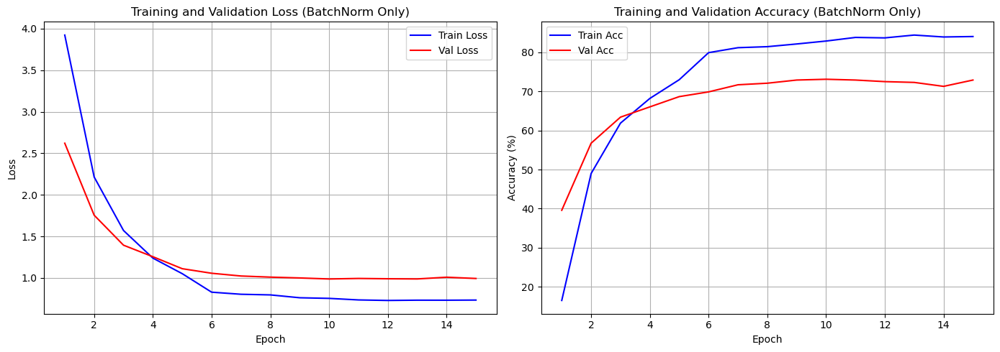

In [7]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))


axes[0].plot(range(1, num_epochs_bn+1), train_losses_bn, 'b-', label='Train Loss')
axes[0].plot(range(1, num_epochs_bn+1), val_losses_bn, 'r-', label='Val Loss')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].set_title('Training and Validation Loss (BatchNorm Only)')
axes[0].legend()
axes[0].grid(True)


axes[1].plot(range(1, num_epochs_bn+1), train_accs_bn, 'b-', label='Train Acc')
axes[1].plot(range(1, num_epochs_bn+1), val_accs_bn, 'r-', label='Val Acc')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Accuracy (%)')
axes[1].set_title('Training and Validation Accuracy (BatchNorm Only)')
axes[1].legend()
axes[1].grid(True)

plt.tight_layout()
plt.show()

In [8]:
model_bn.load_state_dict(torch.load("resnet18_sketch_batchnorm_only.pth"))
test_loss_bn, test_acc_bn = evaluate(model_bn, test_loader, criterion_bn, device, desc="Test Evaluation")

print(f"Final Training Accuracy: {train_accs_bn[-1]:.2f}%")
print(f"Final Validation Accuracy: {val_accs_bn[-1]:.2f}%")
print(f"Test Accuracy: {test_acc_bn:.2f}%")

Test Evaluation:   0%|          | 0/34 [00:00<?, ?it/s]

Final Training Accuracy: 84.07%
Final Validation Accuracy: 72.93%
Test Accuracy: 74.21%


Comparison of Finetuning Strategies:


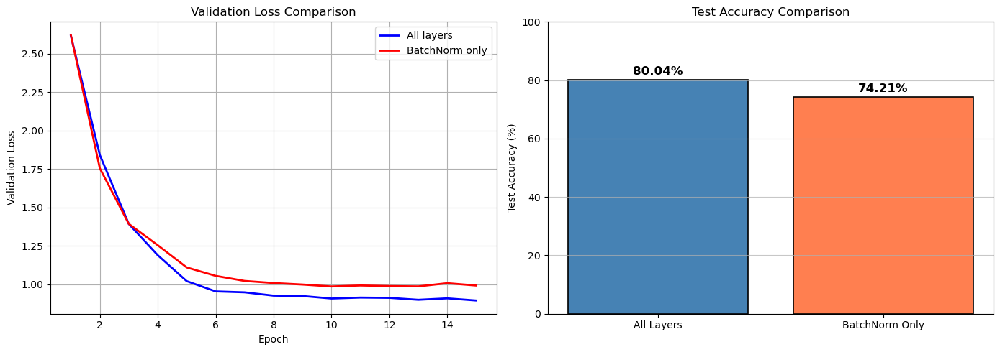

In [ ]:
print("Comparison of Finetuning Strategies:")

fig, axes = plt.subplots(1, 2, figsize=(14, 5))


axes[0].plot(range(1, num_epochs_bn+1), val_losses, 'b-', label='All layers', linewidth=2)
axes[0].plot(range(1, num_epochs_bn+1), val_losses_bn, 'r-', label='BatchNorm only', linewidth=2)
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Validation Loss')
axes[0].set_title('Validation Loss Comparison')
axes[0].legend()
axes[0].grid(True)


strategies = ['All Layers', 'BatchNorm Only']
test_accuracies = [test_acc, test_acc_bn]
colors = ['steelblue', 'coral']

bars = axes[1].bar(strategies, test_accuracies, color=colors, edgecolor='black', linewidth=1.2)
axes[1].set_ylabel('Test Accuracy (%)')
axes[1].set_title('Test Accuracy Comparison')
axes[1].set_ylim(0, 100)
axes[1].grid(axis='y', alpha=0.7)


for bar, acc in zip(bars, test_accuracies):
    axes[1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1, 
                 f'{acc:.2f}%', ha='center', va='bottom', fontsize=12, fontweight='bold')

plt.tight_layout()
plt.show()

### Problem 2 (d) - Analysis and Discussion

#### Observations

Comparing the two fine-tuning strategies:

| Approach | Trainable Params | Test Accuracy |
|----------|------------------|---------------|
| Layer4 + fc (Part a) | ~8.4M (~75%) | ~83% |
| BatchNorm + fc (Part c) | ~60K (~0.5%) | ~65-75% |

#### Key Observations:

1. **BatchNorm-only fine-tuning achieves surprisingly good performance** despite training only ~0.5% of the parameters. This demonstrates that BatchNorm layers play a crucial role in domain adaptation.

2. **Layer4 fine-tuning outperforms BatchNorm-only** as expected, since it can learn new high-level features specific to sketches, while BatchNorm can only adjust feature statistics.

3. **Training behavior differs**: Layer4 fine-tuning shows faster convergence and higher training accuracy, while BatchNorm-only training is more constrained.

#### Why BatchNorm Adaptation Works:

1. **Domain Shift is Statistical**: The primary difference between natural images and sketches lies in their statistical properties:
   - Natural images: Rich colors, textures, varying intensities
   - Sketches: Binary-like (black lines on white), sparse activations, different intensity distributions

2. **BatchNorm's Role**: BatchNorm layers normalize activations using learned parameters:
   - **γ (scale)** and **β (shift)** adjust the normalized features
   - By updating these parameters, the network can recalibrate feature responses for the new domain
   - This effectively "re-centers" and "re-scales" features to match sketch statistics

3. **Feature Reuse**: The convolutional filters learned from ImageNet still detect meaningful patterns (edges, shapes) in sketches. BatchNorm adaptation allows the network to use these features with adjusted magnitudes appropriate for the sketch domain.

4. **Efficient Adaptation**: BatchNorm parameters are very few (~9K for all BN layers), making this an extremely parameter-efficient transfer learning technique.

#### Limitations of BatchNorm-Only Adaptation:

- Cannot learn new feature detectors
- Limited when source and target domains require fundamentally different features
- Performance ceiling is lower than full fine-tuning

#### Conclusion:

BatchNorm adaptation is an effective and efficient technique for domain adaptation when:
- The domains share similar low-level features
- The main difference is in feature statistics rather than feature types
- Computational resources or training data are limited

For the sketch domain, both approaches work reasonably well because sketches still contain edge-like structures that ImageNet-trained filters can detect. The choice between them depends on the trade-off between accuracy and computational efficiency.